In [1]:
!wget -c https://pjreddie.com/media/files/yolov3.weights
!wget -c https://pjreddie.com/media/files/yolov3-tiny.weights
!wget -c https://pjreddie.com/media/files/darknet53.conv.74
!wget -c https://raw.githubusercontent.com/eriklindernoren/PyTorch-YOLOv3/master/config/yolov3-tiny.cfg
!wget -c https://raw.githubusercontent.com/eriklindernoren/PyTorch-YOLOv3/master/config/yolov3.cfg

--2020-01-19 07:39:30--  https://pjreddie.com/media/files/yolov3.weights
Resolving pjreddie.com (pjreddie.com)... 128.208.4.108
Connecting to pjreddie.com (pjreddie.com)|128.208.4.108|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 248007048 (237M) [application/octet-stream]
Saving to: ‘yolov3.weights’

yolov3.weights      100%[===================>] 236.52M  37.5MB/s    in 6.7s    

2020-01-19 07:39:37 (35.4 MB/s) - ‘yolov3.weights’ saved [248007048/248007048]

--2020-01-19 07:39:38--  https://pjreddie.com/media/files/yolov3-tiny.weights
Resolving pjreddie.com (pjreddie.com)... 128.208.4.108
Connecting to pjreddie.com (pjreddie.com)|128.208.4.108|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 35434956 (34M) [application/octet-stream]
Saving to: ‘yolov3-tiny.weights’

yolov3-tiny.weights 100%[===================>]  33.79M  25.3MB/s    in 1.3s    

2020-01-19 07:39:40 (25.3 MB/s) - ‘yolov3-tiny.weights’ saved [35434956/35434956]

--202

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pylab as plt
import seaborn as sns
import pickle
import cv2
import os
import json
from keras.preprocessing.image import ImageDataGenerator, array_to_img, img_to_array, load_img
import torch, torchvision
from torch.nn import functional as F
from torch import nn
import matplotlib.pyplot as plt
%matplotlib inline
from mpl_toolkits.mplot3d import Axes3D
from tqdm import tqdm
from IPython.display import clear_output, display

sns.set_style("whitegrid")
my_pal = sns.color_palette(n_colors=10)

Using TensorFlow backend.


In [3]:
from torch.optim import Optimizer
import itertools as it
import math


class Lookahead(Optimizer):
    def __init__(self, base_optimizer,alpha=0.5, k=6):
        if not 0.0 <= alpha <= 1.0:
            raise ValueError(f'Invalid slow update rate: {alpha}')
        if not 1 <= k:
            raise ValueError(f'Invalid lookahead steps: {k}')
        self.optimizer = base_optimizer
        self.param_groups = self.optimizer.param_groups
        self.alpha = alpha
        self.k = k
        for group in self.param_groups:
            group["step_counter"] = 0
        self.slow_weights = [[p.clone().detach() for p in group['params']]
                                for group in self.param_groups]

        for w in it.chain(*self.slow_weights):
            w.requires_grad = False

    def step(self, closure=None):
        loss = None
        if closure is not None:
            loss = closure()
        loss = self.optimizer.step()
        for group,slow_weights in zip(self.param_groups,self.slow_weights):
            group['step_counter'] += 1
            if group['step_counter'] % self.k != 0:
                continue
            for p,q in zip(group['params'],slow_weights):
                if p.grad is None:
                    continue
                q.data.add_(self.alpha,p.data - q.data)
                p.data.copy_(q.data)
        return loss

class RAdam(Optimizer):
    '''
    a PyTorch implementation of the RAdam Optimizer from th paper
    On the Variance of the Adaptive Learning Rate and Beyond.
    https://arxiv.org/abs/1908.03265
    Example:
        >>> from optimizer import RAdam
        >>> optimizer = RAdam(model.parameters(), lr=0.001)
    '''

    def __init__(self, params, lr=1e-3, betas=(0.9, 0.999), eps=1e-8, weight_decay=0):
        defaults = dict(lr=lr, betas=betas, eps=eps, weight_decay=weight_decay)
        self.buffer = [[None, None, None] for ind in range(10)]
        super(RAdam, self).__init__(params, defaults)

    def __setstate__(self, state):
        super(RAdam, self).__setstate__(state)

    def step(self, closure=None):

        loss = None
        if closure is not None:
            loss = closure()

        for group in self.param_groups:

            for p in group['params']:
                if p.grad is None:
                    continue
                grad = p.grad.data.float()
                if grad.is_sparse:
                    raise RuntimeError('RAdam does not support sparse gradients')

                p_data_fp32 = p.data.float()

                state = self.state[p]

                if len(state) == 0:
                    state['step'] = 0
                    state['exp_avg'] = torch.zeros_like(p_data_fp32)
                    state['exp_avg_sq'] = torch.zeros_like(p_data_fp32)
                else:
                    state['exp_avg'] = state['exp_avg'].type_as(p_data_fp32)
                    state['exp_avg_sq'] = state['exp_avg_sq'].type_as(p_data_fp32)

                exp_avg, exp_avg_sq = state['exp_avg'], state['exp_avg_sq']
                beta1, beta2 = group['betas']

                exp_avg_sq.mul_(beta2).addcmul_(1 - beta2, grad, grad)
                exp_avg.mul_(beta1).add_(1 - beta1, grad)

                state['step'] += 1
                buffered = self.buffer[int(state['step'] % 10)]
                if state['step'] == buffered[0]:
                    N_sma, step_size = buffered[1], buffered[2]
                else:
                    buffered[0] = state['step']
                    beta2_t = beta2 ** state['step']
                    N_sma_max = 2 / (1 - beta2) - 1
                    N_sma = N_sma_max - 2 * state['step'] * beta2_t / (1 - beta2_t)
                    buffered[1] = N_sma
                    if N_sma > 5:
                        step_size = group['lr'] * math.sqrt((1 - beta2_t) * (N_sma - 4) / (N_sma_max - 4) * (N_sma - 2) / N_sma * N_sma_max / (N_sma_max - 2)) / (1 - beta1 ** state['step'])
                    else:
                        step_size = group['lr'] / (1 - beta1 ** state['step'])
                    buffered[2] = step_size

                if group['weight_decay'] != 0:
                    p_data_fp32.add_(-group['weight_decay'] * group['lr'], p_data_fp32)

                if N_sma > 5:
                    denom = exp_avg_sq.sqrt().add_(group['eps'])
                    p_data_fp32.addcdiv_(-step_size, exp_avg, denom)
                else:
                    p_data_fp32.add_(-step_size, exp_avg)

                p.data.copy_(p_data_fp32)

        return loss

#
class Ralamb(Optimizer):
    '''
    Ralamb optimizer (RAdam + LARS trick)
    '''
    def __init__(self, params, lr=1e-3, betas=(0.9, 0.999), eps=1e-8, weight_decay=0):
        defaults = dict(lr=lr, betas=betas, eps=eps, weight_decay=weight_decay)
        self.buffer = [[None, None, None] for ind in range(10)]
        super(Ralamb, self).__init__(params, defaults)

    def __setstate__(self, state):
        super(Ralamb, self).__setstate__(state)

    def step(self, closure=None):

        loss = None
        if closure is not None:
            loss = closure()

        for group in self.param_groups:

            for p in group['params']:
                if p.grad is None:
                    continue
                grad = p.grad.data.float()
                if grad.is_sparse:
                    raise RuntimeError('Ralamb does not support sparse gradients')

                p_data_fp32 = p.data.float()

                state = self.state[p]

                if len(state) == 0:
                    state['step'] = 0
                    state['exp_avg'] = torch.zeros_like(p_data_fp32)
                    state['exp_avg_sq'] = torch.zeros_like(p_data_fp32)
                else:
                    state['exp_avg'] = state['exp_avg'].type_as(p_data_fp32)
                    state['exp_avg_sq'] = state['exp_avg_sq'].type_as(p_data_fp32)

                exp_avg, exp_avg_sq = state['exp_avg'], state['exp_avg_sq']
                beta1, beta2 = group['betas']

                # Decay the first and second moment running average coefficient
                # m_t
                exp_avg.mul_(beta1).add_(1 - beta1, grad)
                # v_t
                exp_avg_sq.mul_(beta2).addcmul_(1 - beta2, grad, grad)

                state['step'] += 1
                buffered = self.buffer[int(state['step'] % 10)]

                if state['step'] == buffered[0]:
                    N_sma, radam_step = buffered[1], buffered[2]
                else:
                    buffered[0] = state['step']
                    beta2_t = beta2 ** state['step']
                    N_sma_max = 2 / (1 - beta2) - 1
                    N_sma = N_sma_max - 2 * state['step'] * beta2_t / (1 - beta2_t)
                    buffered[1] = N_sma

                    # more conservative since it's an approximated value
                    if N_sma >= 5:
                        radam_step = group['lr'] * math.sqrt((1 - beta2_t) * (N_sma - 4) / (N_sma_max - 4) * (N_sma - 2) / N_sma * N_sma_max / (N_sma_max - 2)) / (1 - beta1 ** state['step'])
                    else:
                        radam_step = group['lr'] / (1 - beta1 ** state['step'])
                    buffered[2] = radam_step

                if group['weight_decay'] != 0:
                    p_data_fp32.add_(-group['weight_decay'] * group['lr'], p_data_fp32)

                weight_norm = p.data.pow(2).sum().sqrt().clamp(0, 10)
                radam_norm = p_data_fp32.pow(2).sum().sqrt()
                if weight_norm == 0 or radam_norm == 0:
                    trust_ratio = 1
                else:
                    trust_ratio = weight_norm / radam_norm

                state['weight_norm'] = weight_norm
                state['adam_norm'] = radam_norm
                state['trust_ratio'] = trust_ratio

                # more conservative since it's an approximated value
                if N_sma >= 5:
                    denom = exp_avg_sq.sqrt().add_(group['eps'])
                    p_data_fp32.addcdiv_(-radam_step * trust_ratio, exp_avg, denom)
                else:
                    p_data_fp32.add_(-radam_step * trust_ratio, exp_avg)

                p.data.copy_(p_data_fp32)

        return loss

## Constants

In [4]:
!ls

__notebook__.ipynb  darknet53.conv.74  yolov3-tiny.weights  yolov3.weights
__output__.json     yolov3-tiny.cfg    yolov3.cfg


In [5]:
TRAIN_IMAGES_DIR = '../input/pku-autonomous-driving/train_images/'
TEST_IMAGES_DIR = '../input/pku-autonomous-driving/test_images/'
TRAIN_MASKS_DIR = '../input/pku-autonomous-driving/train_masks/'
TEST_MASKS_DIR = '../input/pku-autonomous-driving/test_masks/'
TRAIN_CSV_PATH = '../input/pku-autonomous-driving/train.csv'
CAMERA_INTRINSIC_PATH = '../input/pku-autonomous-driving/camera/camera_intrinsic.txt'
YOLO_CONFIG_PATH = 'yolov3.cfg'
YOLO_WEIGHTS_PATH = 'yolov3.weights'
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
IMG_SIZE = 416
ORIGINAL_IMG_SIZE = (2710, 3384)
CAR_PARAMS = ['model_type', 'yaw', 'pitch', 'roll', 'x', 'y', 'z']
GRID_SIZE = 9
ANCHORS = 5
x_l = 1.02
y_l = 0.80
z_l = 2.31
PREDICT_PARAMS = ['confidence', 'x', 'y', 'yaw', 'pitch', 'roll']
D_X = IMG_SIZE / ORIGINAL_IMG_SIZE[1]
D_Y = IMG_SIZE / ORIGINAL_IMG_SIZE[0]

In [6]:
camera_config = {}
with open(CAMERA_INTRINSIC_PATH, 'r') as f:
    for line in f.readlines():
        key, value = line.strip(';\n').split(' = ')
        camera_config[key] = float(value)
intrinsic_matrix = np.array([[camera_config['fx'], 0, camera_config['cx']],
                            [0, camera_config['fy'], camera_config['cy']],
                            [0, 0, 1]])

## Load Data

In [7]:
train = pd.read_csv(TRAIN_CSV_PATH)
train.head()

,ImageId,PredictionString
0,ID_8a6e65317,16 0.254839 -2.57534 -3.10256 7.96539 3.20066 ...
1,ID_337ddc495,66 0.163988 0.192169 -3.12112 -3.17424 6.55331...
2,ID_a381bf4d0,43 0.162877 0.00519276 -3.02676 2.1876 3.53427...
3,ID_7c4a3e0aa,43 0.126957 -3.04442 -3.10883 -14.738 24.6389 ...
4,ID_8b510fad6,37 0.16017 0.00862796 -3.0887 -3.04548 3.4977 ...


In [8]:
print('Example Prediction String....')
print(train['PredictionString'].values[0])

Example Prediction String....
16 0.254839 -2.57534 -3.10256 7.96539 3.20066 11.0225 56 0.181647 -1.46947 -3.12159 9.60332 4.66632 19.339 70 0.163072 -1.56865 -3.11754 10.39 11.2219 59.7825 70 0.141942 -3.1395 3.11969 -9.59236 5.13662 24.7337 46 0.163068 -2.08578 -3.11754 9.83335 13.2689 72.9323


## Preprocessing

In [9]:
train['NumCars'] = [int((x.count(' ')+1)/7) for x in train['PredictionString']]

In [10]:
image_id_expanded = [item for item, count in 
                     zip(train['ImageId'], train['NumCars']) for i in range(count)]
prediction_strings_expanded = train['PredictionString'].str.split(' ',expand = True).values.reshape(-1,7).astype(float)
prediction_strings_expanded = prediction_strings_expanded[~np.isnan(prediction_strings_expanded).all(axis=1)]
train_expanded = pd.DataFrame(
    {
        'ImageId': image_id_expanded,
        'model_type': prediction_strings_expanded[:,0].astype(int),
        'yaw':prediction_strings_expanded[:,1],
        'pitch':prediction_strings_expanded[:,2],
        'roll':prediction_strings_expanded[:,3],
        'x':prediction_strings_expanded[:,4],
        'y':prediction_strings_expanded[:,5],
        'z':prediction_strings_expanded[:,6]
    })
print("Shapes of exapanded training dataset:");print(train_expanded.shape)
print("Expanded Training Data Sample");display(train_expanded.head(10))

Shapes of exapanded training dataset:
(49684, 8)
Expanded Training Data Sample


,ImageId,model_type,yaw,pitch,roll,x,y,z
0,ID_8a6e65317,16,0.254839,-2.575340,-3.10256,7.96539,3.20066,11.0225
1,ID_8a6e65317,56,0.181647,-1.469470,-3.12159,9.60332,4.66632,19.3390
2,ID_8a6e65317,70,0.163072,-1.568650,-3.11754,10.39000,11.22190,59.7825
3,ID_8a6e65317,70,0.141942,-3.139500,3.11969,-9.59236,5.13662,24.7337
4,ID_8a6e65317,46,0.163068,-2.085780,-3.11754,9.83335,13.26890,72.9323
5,ID_337ddc495,66,0.163988,0.192169,-3.12112,-3.17424,6.55331,31.4339
6,ID_337ddc495,60,0.112482,-2.963070,3.13951,-14.72690,10.20770,54.8175
7,ID_337ddc495,28,0.186114,0.357280,-3.10043,-7.49818,10.31120,54.0320
8,ID_337ddc495,66,0.020968,0.218402,3.12213,-10.35310,11.24530,63.7140
9,ID_337ddc495,46,0.195428,-2.847780,-3.13394,-22.77110,13.07040,72.2694


In [11]:
def draw_points(image, points, radius=5):
    image = np.array(image)
    for (p_x, p_y) in points:
        cv2.circle(image, (p_x, p_y), radius, (255, 0, 0), -1)
    return image

def draw_lines(image, points, thickness=4):
    color = (0, 255, 0)
    
#    0 [x_l, y_l, z_l],
#    1 [x_l, y_l, -z_l],
#    2 [x_l, -y_l, z_l],
#    3 [x_l, -y_l, -z_l],
#    4 [-x_l, y_l, z_l],
#    5 [-x_l, y_l, -z_l],
#    6 [-x_l, -y_l, z_l],
#    7 [-x_l, -y_l, -z_l],
    
    cv2.line(image, tuple(points[0][:2]), tuple(points[1][:2]), color, thickness)
    cv2.line(image, tuple(points[0][:2]), tuple(points[2][:2]), color, thickness)
    cv2.line(image, tuple(points[0][:2]), tuple(points[4][:2]), color, thickness)
    
    cv2.line(image, tuple(points[7][:2]), tuple(points[6][:2]), color, thickness)
    cv2.line(image, tuple(points[7][:2]), tuple(points[5][:2]), color, thickness)
    cv2.line(image, tuple(points[7][:2]), tuple(points[3][:2]), color, thickness)
    
    cv2.line(image, tuple(points[4][:2]), tuple(points[5][:2]), color, thickness)
    cv2.line(image, tuple(points[4][:2]), tuple(points[6][:2]), color, thickness)
    
    cv2.line(image, tuple(points[1][:2]), tuple(points[3][:2]), color, thickness)
    cv2.line(image, tuple(points[1][:2]), tuple(points[5][:2]), color, thickness)
    
    cv2.line(image, tuple(points[2][:2]), tuple(points[3][:2]), color, thickness)
    cv2.line(image, tuple(points[2][:2]), tuple(points[6][:2]), color, thickness)
    
    
    return image

In [12]:
# def euler_to_rotation(yaw, pitch, roll):
#     cos = np.cos
#     sin = np.sin
#     Y = np.array([[cos(yaw), -sin(yaw), 0],
#                   [sin(yaw), cos(yaw), 0],
#                   [0, 0, 1]])
#     P = np.array([[cos(pitch), 0, sin(pitch)],
#                   [0, 1, 0],
#                   [-sin(pitch), 0, cos(pitch)]])
#     R = np.array([[1, 0, 0],
#                   [0, cos(roll), -sin(roll)],
#                   [0, sin(roll), cos(roll)]])
#     return np.dot(P, np.dot(R, Y))

def euler_to_rotation(yaw, pitch, roll):
    cos = np.cos
    sin = np.sin
    Y = np.array([[cos(yaw), 0, sin(yaw)],
                  [0, 1, 0],
                  [-sin(yaw), 0, cos(yaw)]])
    P = np.array([[1, 0, 0],
                  [0, cos(pitch), -sin(pitch)],
                  [0, sin(pitch), cos(pitch)]])
    R = np.array([[cos(roll), -sin(roll), 0],
                  [sin(roll), cos(roll), 0],
                  [0, 0, 1]])
    return np.dot(Y, np.dot(P, R))
    
def img_cor_2_world_cor(xyz, A=intrinsic_matrix):
    x_img, y_img, z_img = np.asarray(xyz).squeeze()
    xc, yc, zc = x_img*z_img, y_img*z_img, z_img
    p_cam = np.array([xc, yc, zc])
    xw, yw, zw = np.dot(np.linalg.inv(A), p_cam)
    return xw, yw, zw

def get_uv(t, ypr, xyz=[[0, 0, 0]], A=intrinsic_matrix):
    A = A.astype('float32')
    xyz = np.array(xyz)
    xyz = np.column_stack([xyz, np.ones((xyz.shape[0], 1))])
    R = euler_to_rotation(*ypr).T
    t = np.expand_dims(t, axis=1)
    Rt = np.column_stack([R, t]).astype('float32')
    xyz_ =  np.asarray(np.matmul(np.matmul(A, Rt), np.matrix(xyz).T))
    xy = xyz_[:2, :] / xyz_[2, :]
    
    return xy.astype('int').T
    
    
def rescale_centers(centers, current_dim, original_shape):
    orig_h, orig_w = original_shape
    # The amount of padding that was added
    centers = centers * current_dim
    
    pad_x = max(orig_h - orig_w, 0) * (current_dim / max(original_shape))
    pad_y = max(orig_w - orig_h, 0) * (current_dim / max(original_shape))

    # Image height and width after padding is removed
    unpad_h = current_dim - pad_y
    unpad_w = current_dim - pad_x
        
    centers[:, 0] = ((centers[:, 0] - pad_x // 2) / unpad_w) * orig_w
    centers[:, 1] = ((centers[:, 1] - pad_y // 2) / unpad_h) * orig_h
    return centers


def rescale_volume(volume, current_dim, original_shape, upscale=False):
    orig_h, orig_w = original_shape
    if upscale:
        volume *= current_dim
    # The amount of padding that was added
    
    pad_x = max(orig_h - orig_w, 0) * (current_dim / max(original_shape))
    pad_y = max(orig_w - orig_h, 0) * (current_dim / max(original_shape))

    # Image height and width after padding is removed
    unpad_h = current_dim - pad_y
    unpad_w = current_dim - pad_x
        
    volume[:, 0] = ((volume[:, 0] - pad_x // 2) / unpad_w) * orig_w
    volume[:, 1] = ((volume[:, 1] - pad_y // 2) / unpad_h) * orig_h
    volume[:, 0] = volume[:, 0].clip(0, orig_w-1)
    volume[:, 1] = volume[:, 1].clip(0, orig_h-1)
    
    return volume

    
def rescale_box(box, current_dim, original_shape):
    """ Rescales bounding boxes to the original shape """
    orig_h, orig_w = original_shape
    # The amount of padding that was added
    pad_x = max(orig_h - orig_w, 0) * (current_dim / max(original_shape))
    pad_y = max(orig_w - orig_h, 0) * (current_dim / max(original_shape))
    # Image height and width after padding is removed
    unpad_h = current_dim - pad_y
    unpad_w = current_dim - pad_x
    
    x1, y1, x2, y2 = box
    # Rescale bounding boxes to dimension of original image
    x1 = ((x1 - pad_x // 2) / unpad_w) * orig_w
    y1 = ((y1 - pad_y // 2) / unpad_h) * orig_h
    x2 = ((x2 - pad_x // 2) / unpad_w) * orig_w
    y2 = ((y2 - pad_y // 2) / unpad_h) * orig_h
    
#     boxes[:, 0] = boxes[:, 0].clip(0, orig_w-1)
#     boxes[:, 1] = boxes[:, 1].clip(0, orig_h-1)
#     boxes[:, 2] = boxes[:, 2].clip(0, orig_w-1)
#     boxes[:, 3] = boxes[:, 3].clip(0, orig_h-1)
    
    return np.array([x1, y1, x2, y2])


def show_gpu_usage():
    print(torch.cuda.get_device_name(0))
    print('Memory Usage:')
    print('Allocated:', round(torch.cuda.memory_allocated(0)/1024**3,1), 'GB')
    print('Cached:   ', round(torch.cuda.memory_cached(0)/1024**3,1), 'GB')

In [13]:
def transform_coord(row):
    xyz = (float(row['x']), float(row['y']), float(row['z']))
    ypr = (-float(row['pitch']), -float(row['yaw']), -float(row['roll']))
    x, y = get_uv(xyz, ypr, intrinsic_matrix).T
    return x, y

def get_volume_2d(row):
    xyz = (float(row['x']), float(row['y']), float(row['z']))
    yaw, pitch, roll = (float(row['yaw']), float(row['pitch']), float(row['roll']))
    ypr = -pitch, -yaw, -roll
    edges = np.array([
        [x_l, y_l, z_l],
        [x_l, y_l, -z_l],
        [x_l, -y_l, z_l],
        [x_l, -y_l, -z_l],
        [-x_l, y_l, z_l],
        [-x_l, y_l, -z_l],
        [-x_l, -y_l, z_l],
        [-x_l, -y_l, -z_l],
    ])
    c_x, c_y = get_uv(xyz, ypr).T
    e = get_uv(xyz, ypr, edges, intrinsic_matrix)
    return e.astype('int32')


train_expanded['2d_coords'] = train_expanded.apply(transform_coord, axis=1)
train_expanded['volume_2d'] = train_expanded.apply(get_volume_2d, axis=1)


In [14]:
train_expanded['x_2d'] = train_expanded['2d_coords'].apply(lambda x: x[0])
train_expanded['y_2d'] = train_expanded['2d_coords'].apply(lambda x: x[1])

train_expanded['v_x1'] = train_expanded['volume_2d'].apply(lambda x: x[0][0])
train_expanded['v_y1'] = train_expanded['volume_2d'].apply(lambda x: x[0][1])
train_expanded['v_x2'] = train_expanded['volume_2d'].apply(lambda x: x[1][0])
train_expanded['v_y2'] = train_expanded['volume_2d'].apply(lambda x: x[1][1])
train_expanded['v_x3'] = train_expanded['volume_2d'].apply(lambda x: x[2][0])
train_expanded['v_y3'] = train_expanded['volume_2d'].apply(lambda x: x[2][1])
train_expanded['v_x4'] = train_expanded['volume_2d'].apply(lambda x: x[3][0])
train_expanded['v_y4'] = train_expanded['volume_2d'].apply(lambda x: x[3][1])
train_expanded['v_x5'] = train_expanded['volume_2d'].apply(lambda x: x[4][0])
train_expanded['v_y5'] = train_expanded['volume_2d'].apply(lambda x: x[4][1])
train_expanded['v_x6'] = train_expanded['volume_2d'].apply(lambda x: x[5][0])
train_expanded['v_y6'] = train_expanded['volume_2d'].apply(lambda x: x[5][1])
train_expanded['v_x7'] = train_expanded['volume_2d'].apply(lambda x: x[6][0])
train_expanded['v_y7'] = train_expanded['volume_2d'].apply(lambda x: x[6][1])
train_expanded['v_x8'] = train_expanded['volume_2d'].apply(lambda x: x[7][0])
train_expanded['v_y8'] = train_expanded['volume_2d'].apply(lambda x: x[7][1])

In [15]:
def get_bounding_box(row):
    xyz = (float(row['x']), float(row['y']), float(row['z']))
    ypr = (-float(row['pitch']), -float(row['yaw']), -float(row['roll']))
    edges = np.array([
        [x_l, y_l, z_l],
        [x_l, y_l, -z_l],
        [x_l, -y_l, z_l],
        [x_l, -y_l, -z_l],
        [-x_l, y_l, z_l],
        [-x_l, y_l, -z_l],
        [-x_l, -y_l, z_l],
        [-x_l, -y_l, -z_l],
    ])
    c_x, c_y = get_uv(xyz, ypr).T
    e = get_uv(xyz, ypr, edges)
    
    xmin = np.min(e[:, 0])
    ymin = np.min(e[:, 1])
    xmax = np.max(e[:, 0])
    ymax = np.max(e[:, 1])
    
    return np.array([xmin, ymin, xmax, ymax])

train_expanded['box'] = train_expanded.apply(get_bounding_box, axis=1)

In [16]:
def xywh2xyxy(x):
    y = x.new(x.shape)
    y[..., 0] = x[..., 0] - x[..., 2] / 2
    y[..., 1] = x[..., 1] - x[..., 3] / 2
    y[..., 2] = x[..., 0] + x[..., 2] / 2
    y[..., 3] = x[..., 1] + x[..., 3] / 2
    return y

In [17]:
def pad_to_square(img, pad_value):
    c, h, w = img.shape
    dim_diff = np.abs(h - w)
    # (upper / left) padding and (lower / right) padding
    pad1, pad2 = dim_diff // 2, dim_diff - dim_diff // 2
    # Determine padding
    pad = (0, 0, pad1, pad2) if h <= w else (pad1, pad2, 0, 0)
    # Add padding
    img = F.pad(img, pad, "constant", value=pad_value)

    return img, pad


class Dataset(torch.utils.data.Dataset):
    
    def __init__(self, images_dir, masks_dir, annot=None, grid_size=GRID_SIZE, anchors=5):
        self.x_l = 1.02
        self.y_l = 0.80
        self.z_l = 2.31
        self.annot = annot
        self.images_dir = images_dir
        self.masks_dir = masks_dir
        self.grid_size = grid_size
        self.anchors = anchors
        if annot is not None:
            self.image_names = self.annot['ImageId'].unique()
        else:
            self.image_names = os.listdir(images_dir)
        
    def __getitem__(self, idx):
        file_name = self.image_names[idx] if self.image_names[idx].endswith('.jpg') else self.image_names[idx] + '.jpg'
        image = cv2.imread(os.path.join(self.images_dir, file_name))
        mask_path = os.path.join(self.masks_dir, self.image_names[idx] + '.jpg')
        if os.path.exists(mask_path):
            mask = cv2.imread(mask_path)
        else:
            mask = np.zeros(image.shape)
        if self.annot is not None:
            annot = self.annot[self.annot['ImageId'] == self.image_names[idx]].drop(columns=['ImageId'])
#             return image, mask, annot
            processed, target = self.annot_to_yolo(image, annot)
            return image, processed, target#, torch.from_numpy(mask)
        return image, self.process_image(image), self.image_names[idx].split('.')[0]
    
    def __len__(self):
        return len(self.image_names)
    
    def process_image(self, image):
        nh = IMG_SIZE if image.shape[0] > image.shape[1] else IMG_SIZE * image.shape[0] / image.shape[1]
        nw = IMG_SIZE if image.shape[1] > image.shape[0] else IMG_SIZE * image.shape[1] / image.shape[0]
        
        h, w = image.shape[:2]
        
        image = cv2.resize(image, (int(nw), int(nh)))
        
        image = torch.from_numpy(image).permute(2, 0, 1)
        
        image, pad = pad_to_square(image, 0)
        
        return image
    
    def annot_to_yolo(self, image, annot):
        
        nh = IMG_SIZE if image.shape[0] > image.shape[1] else IMG_SIZE * image.shape[0] / image.shape[1]
        nw = IMG_SIZE if image.shape[1] > image.shape[0] else IMG_SIZE * image.shape[1] / image.shape[0]
        
        h, w = image.shape[:2]
        
        image = cv2.resize(image, (int(nw), int(nh)))
        
        image = torch.from_numpy(image).permute(2, 0, 1)
        
        # Pad to square resolution
        image, pad = pad_to_square(image, 0)
                
        _, padded_h, padded_w = image.size()

        boxes = np.array([box for box in annot['box'].values]).astype('float32')

        v_xs = [annot['v_x{}'.format(i)].values for i in range(1, 9)]
        v_ys = [annot['v_y{}'.format(i)].values for i in range(1, 9)]
        
        z = annot['z'].values
        
        targets = None
        # Extract coordinates for unpadded + unscaled image
        x1 = boxes[:, 0] / w * nw
        y1 = boxes[:, 1] / h * nh
        x2 = boxes[:, 2] / w * nw
        y2 = boxes[:, 3] / h * nh
        
        # Adjust for added padding
        x1 += pad[0]
        y1 += pad[2]
        x2 += pad[1]
        y2 += pad[3]
        
        x1 = x1.astype('float32')
        y1 = y1.astype('float32')
        x2 = x2.astype('float32')
        y2 = y2.astype('float32')

        boxes[:, 0] = ((x1 + x2) / 2) / float(padded_w)
        boxes[:, 1] = ((y1 + y2) / 2) / float(padded_h)
        boxes[:, 2] = (x2 - x1) / float(padded_w)
        boxes[:, 3] = (y2 - y1) / float(padded_h)
        
        boxes[:, 0] = np.clip(boxes[:, 0], 0, 0.999)
        boxes[:, 1] = np.clip(boxes[:, 1], 0, 0.999)
        
        targets = np.zeros((len(boxes), 23))
        targets[:, 2:6] = boxes
        
        v_xs = np.array(v_xs) / w * nw
        v_ys = np.array(v_ys) / h * nh
        v_xs += pad[0]
        v_ys += pad[2]
        v_xs /= padded_w
        v_ys /= padded_h
        
        v_xs = np.clip(v_xs, 0, 0.999)
        v_ys = np.clip(v_ys, 0, 0.999)
        
        targets[:, 6] = v_xs[0]
        targets[:, 7] = v_ys[0]
        targets[:, 8] = v_xs[1]
        targets[:, 9] = v_ys[1]
        targets[:, 10] = v_xs[2]
        targets[:, 11] = v_ys[2]
        targets[:, 12] = v_xs[3]
        targets[:, 13] = v_ys[3]
        targets[:, 14] = v_xs[4]
        targets[:, 15] = v_ys[4]
        targets[:, 16] = v_xs[5]
        targets[:, 17] = v_ys[5]
        targets[:, 18] = v_xs[6]
        targets[:, 19] = v_ys[6]
        targets[:, 20] = v_xs[7]
        targets[:, 21] = v_ys[7]
        
        targets[:, 22] = z
        
        targets = torch.from_numpy(targets)
            
        return image, targets
        

In [18]:
train_dataset = Dataset(TRAIN_IMAGES_DIR, TRAIN_MASKS_DIR, train_expanded)
test_dataset = Dataset(TEST_IMAGES_DIR, TEST_MASKS_DIR)

## Visualization

In [19]:
def pnp(points_2d, intrinsic_matrix=intrinsic_matrix):
    distCoeffs = np.zeros((8, 1), dtype='float32')

    edges = np.array([
            [x_l, y_l, z_l],
            [x_l, y_l, -z_l],
            [x_l, -y_l, z_l],
            [x_l, -y_l, -z_l],
            [-x_l, y_l, z_l],
            [-x_l, y_l, -z_l],
            [-x_l, -y_l, z_l],
            [-x_l, -y_l, -z_l],
        ])
    _, R_exp, t = cv2.solvePnP(edges, points_2d, intrinsic_matrix, distCoeffs)
    R, _ = cv2.Rodrigues(R_exp)
    
    yaw = -np.arcsin(R[2, 1])
    pitch = np.arctan2(R[2, 0], R[2,2])
    roll = np.arctan2(R[0, 1], R[1,1])
    return -yaw, -pitch, -roll

In [20]:
def visualize_dataset(items):
    for item in items:
        image, processed, annot = item
        
        annot = annot.numpy()
        
        xywh = annot[:, 2:6]
        xyxy = xywh2xyxy(torch.Tensor(xywh * IMG_SIZE)).numpy()
        
        v_xy = annot[:, 6:22]
        
        z = annot[:, 22]
        
        for xyxy, v_xy in zip(xyxy, v_xy):
            xyxy = rescale_box(xyxy, IMG_SIZE, image.shape[:2]).astype('int32')
            x1, y1, x2, y2 = xyxy
            v_xs = v_xy[0::2]
            v_ys = v_xy[1::2]
            
            e = np.row_stack([v_xs, v_ys]).T
            e = rescale_volume(e, IMG_SIZE, image.shape[:2], upscale=True)
#             image = draw_points(image, [(int(xy[0]), int(xy[1]))])
            image = draw_lines(image, e.astype('int32'), 4)
            image = cv2.rectangle(image, (x1, y1), (x2, y2), (255, 0, 0), 5)
        plt.figure(figsize=(12,19))
        plt.imshow(image)

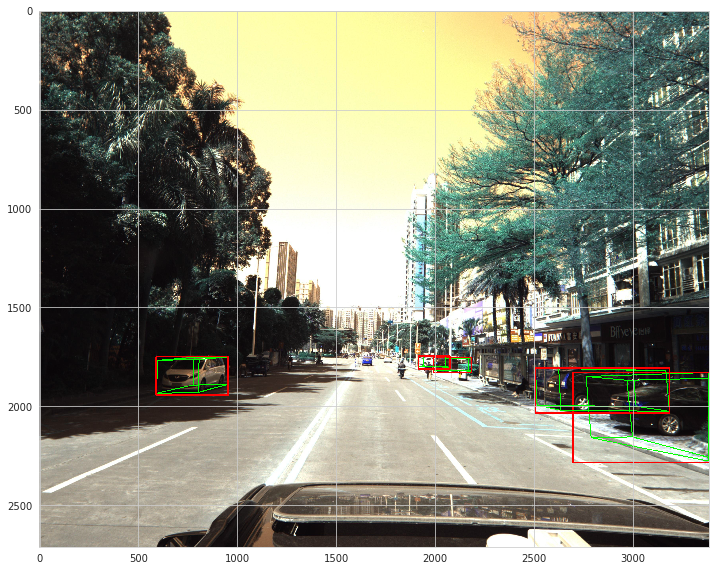

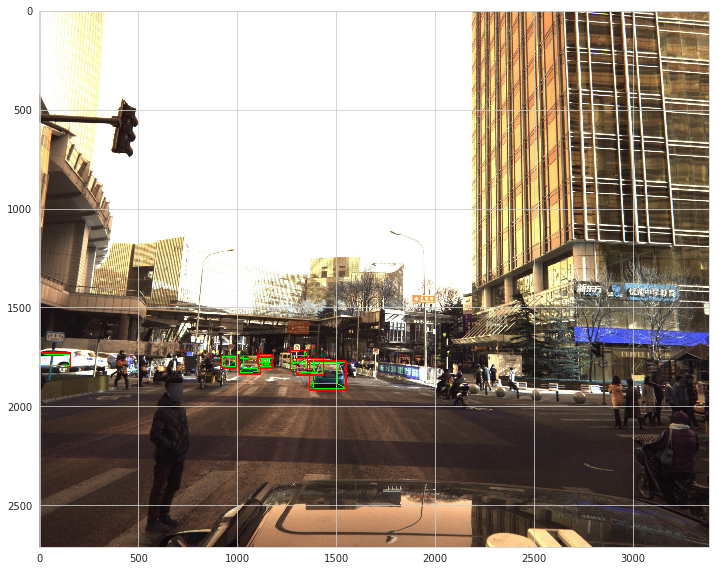

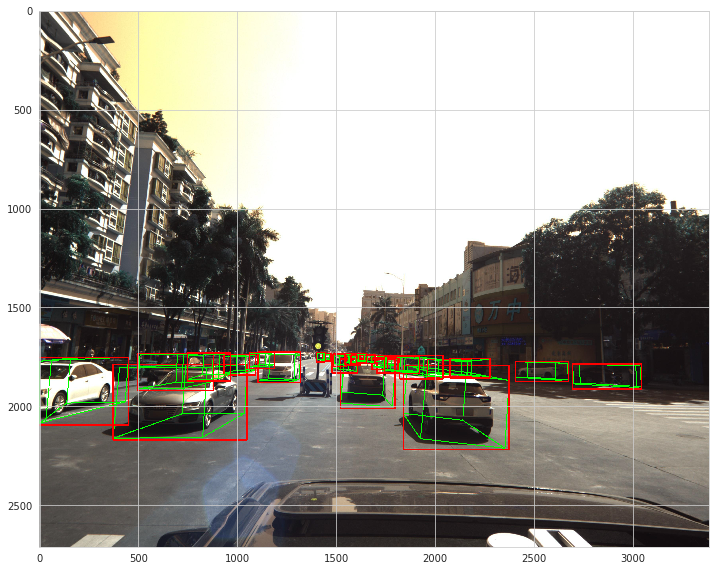

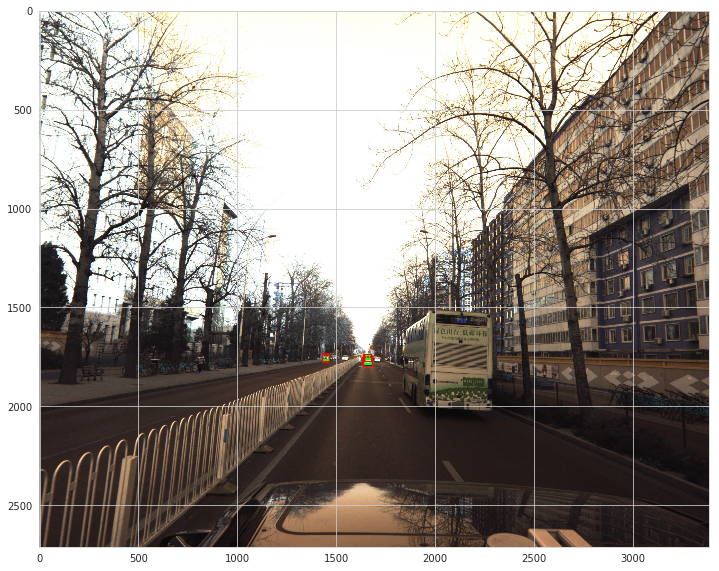

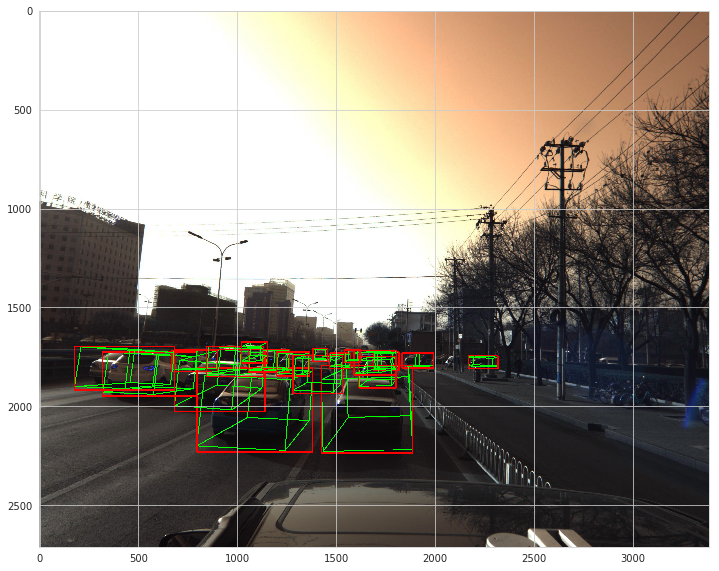

In [21]:
visualize_dataset([train_dataset[i] for i in range(0, 5)])

## Build Model

In [22]:
def bbox_wh_iou(wh1, wh2):
    wh2 = wh2.t()
    w1, h1 = wh1[0], wh1[1]
    w2, h2 = wh2[0], wh2[1]
    inter_area = torch.min(w1, w2) * torch.min(h1, h2)
    union_area = (w1 * h1 + 1e-16) + w2 * h2 - inter_area
    return inter_area / union_area


def bbox_iou(box1, box2, x1y1x2y2=True):
    """
    Returns the IoU of two bounding boxes
    """
    if not x1y1x2y2:
        # Transform from center and width to exact coordinates
        b1_x1, b1_x2 = box1[:, 0] - box1[:, 2] / 2, box1[:, 0] + box1[:, 2] / 2
        b1_y1, b1_y2 = box1[:, 1] - box1[:, 3] / 2, box1[:, 1] + box1[:, 3] / 2
        b2_x1, b2_x2 = box2[:, 0] - box2[:, 2] / 2, box2[:, 0] + box2[:, 2] / 2
        b2_y1, b2_y2 = box2[:, 1] - box2[:, 3] / 2, box2[:, 1] + box2[:, 3] / 2
    else:
        # Get the coordinates of bounding boxes
        b1_x1, b1_y1, b1_x2, b1_y2 = box1[:, 0], box1[:, 1], box1[:, 2], box1[:, 3]
        b2_x1, b2_y1, b2_x2, b2_y2 = box2[:, 0], box2[:, 1], box2[:, 2], box2[:, 3]

    # get the corrdinates of the intersection rectangle
    inter_rect_x1 = torch.max(b1_x1, b2_x1)
    inter_rect_y1 = torch.max(b1_y1, b2_y1)
    inter_rect_x2 = torch.min(b1_x2, b2_x2)
    inter_rect_y2 = torch.min(b1_y2, b2_y2)
    # Intersection area
    inter_area = torch.clamp(inter_rect_x2 - inter_rect_x1 + 1, min=0) * torch.clamp(
        inter_rect_y2 - inter_rect_y1 + 1, min=0
    )
    # Union Area
    b1_area = (b1_x2 - b1_x1 + 1) * (b1_y2 - b1_y1 + 1)
    b2_area = (b2_x2 - b2_x1 + 1) * (b2_y2 - b2_y1 + 1)

    iou = inter_area / (b1_area + b2_area - inter_area + 1e-16)

    return iou

def parse_model_config(path):
    """Parses the yolo-v3 layer configuration file and returns module definitions"""
    file = open(path, 'r')
    lines = file.read().split('\n')
    lines = [x for x in lines if x and not x.startswith('#')]
    lines = [x.rstrip().lstrip() for x in lines] # get rid of fringe whitespaces
    module_defs = []
    for line in lines:
        if line.startswith('['): # This marks the start of a new block
            module_defs.append({})
            module_defs[-1]['type'] = line[1:-1].rstrip()
            if module_defs[-1]['type'] == 'convolutional':
                module_defs[-1]['batch_normalize'] = 0
        else:
            key, value = line.split("=")
            value = value.strip()
            module_defs[-1][key.rstrip()] = value.strip()

    return module_defs

def parse_data_config(path):
    """Parses the data configuration file"""
    options = dict()
    options['gpus'] = '0,1,2,3'
    options['num_workers'] = '10'
    with open(path, 'r') as fp:
        lines = fp.readlines()
    for line in lines:
        line = line.strip()
        if line == '' or line.startswith('#'):
            continue
        key, value = line.split('=')
        options[key.strip()] = value.strip()
    return options

def corner_dist(f_vol, s_vol):
    return np.sqrt(np.mean(np.power(f_vol - s_vol, 2)))

def non_max_suppression(prediction, conf_thres=0.5, nms_thres=0.4):
    """
    Removes detections with lower object confidence score than 'conf_thres' and performs
    Non-Maximum Suppression to further filter detections.
    Returns detections with shape:
        (x1, y1, x2, y2, object_conf, class_score, class_pred)
    """

    # From (center x, center y, width, height) to (x1, y1, x2, y2)
    # x1, y1, x2, y2, conf, yaw, pitch, roll, z, cls...
    
    prediction[..., :4] = xywh2xyxy(prediction[..., :4])
    
    output = [None for _ in range(len(prediction))]
    for image_i, image_pred in enumerate(prediction):
        # Filter out confidence scores below threshold
        image_pred = image_pred[image_pred[:, 4] >= conf_thres]
        # If none are remaining => process next image
        if not image_pred.size(0):
            continue
        # Object confidence times class confidence
        score = image_pred[:, 4] * image_pred[:, 22:].max(1)[0]
        # Sort by it
        image_pred = image_pred[(-score).argsort()]
        class_confs, class_preds = image_pred[:, 22:].max(1, keepdim=True)
        volumes = image_pred[:, 5:21]
        detections = torch.cat((image_pred[:, :5], class_confs.float(), volumes, image_pred[:, 21:22], class_preds.float()), 1)
        # Perform non-maximum suppression
        keep_boxes = []
        while detections.size(0):
            large_overlap = bbox_iou(detections[0, :4].unsqueeze(0), detections[:, :4]) > nms_thres
            label_match = detections[0, -1] == detections[:, -1]
            # Indices of boxes with lower confidence scores, large IOUs and matching labels
            invalid = large_overlap & label_match
            weights = detections[invalid, 4:5]
            # Merge overlapping bboxes by order of confidence
            detections[0, :4] = (weights * detections[invalid, :4]).sum(0) / weights.sum()
            keep_boxes += [detections[0]]
            detections = detections[~invalid]
        if keep_boxes:
            output[image_i] = torch.stack(keep_boxes)

    return output



def build_targets(pred_boxes, pred_cls, target, anchors, ignore_thres):

    ByteTensor = torch.cuda.ByteTensor if pred_boxes.is_cuda else torch.ByteTensor
    FloatTensor = torch.cuda.FloatTensor if pred_boxes.is_cuda else torch.FloatTensor

    nB = pred_boxes.size(0)
    nA = pred_boxes.size(1)
    nC = pred_cls.size(-1)
    nG = pred_boxes.size(2)

    # Output tensors
    obj_mask = ByteTensor(nB, nA, nG, nG).fill_(0)
    noobj_mask = ByteTensor(nB, nA, nG, nG).fill_(1)
    class_mask = FloatTensor(nB, nA, nG, nG).fill_(0)
    iou_scores = FloatTensor(nB, nA, nG, nG).fill_(0)
    tx = FloatTensor(nB, nA, nG, nG).fill_(0)
    ty = FloatTensor(nB, nA, nG, nG).fill_(0)
    tw = FloatTensor(nB, nA, nG, nG).fill_(0)
    th = FloatTensor(nB, nA, nG, nG).fill_(0)
    tvx1 = FloatTensor(nB, nA, nG, nG).fill_(0)
    tvx2 = FloatTensor(nB, nA, nG, nG).fill_(0)
    tvx3 = FloatTensor(nB, nA, nG, nG).fill_(0)
    tvx4 = FloatTensor(nB, nA, nG, nG).fill_(0)
    tvx5 = FloatTensor(nB, nA, nG, nG).fill_(0)
    tvx6 = FloatTensor(nB, nA, nG, nG).fill_(0)
    tvx7 = FloatTensor(nB, nA, nG, nG).fill_(0)
    tvx8 = FloatTensor(nB, nA, nG, nG).fill_(0)
    tvy1 = FloatTensor(nB, nA, nG, nG).fill_(0)
    tvy2 = FloatTensor(nB, nA, nG, nG).fill_(0)
    tvy3 = FloatTensor(nB, nA, nG, nG).fill_(0)
    tvy4 = FloatTensor(nB, nA, nG, nG).fill_(0)
    tvy5 = FloatTensor(nB, nA, nG, nG).fill_(0)
    tvy6 = FloatTensor(nB, nA, nG, nG).fill_(0)
    tvy7 = FloatTensor(nB, nA, nG, nG).fill_(0)
    tvy8 = FloatTensor(nB, nA, nG, nG).fill_(0)
    tz = FloatTensor(nB, nA, nG, nG).fill_(0)
    tcls = FloatTensor(nB, nA, nG, nG, nC).fill_(0)

    # Convert to position relative to box

    target_boxes = target[:, 2:6] * nG
    gxy = target_boxes[:, :2]
    gwh = target_boxes[:, 2:]
    gv = target[:, 6:22] * nG
    gz = target[:, 22]

    # Get anchors with best iou
    ious = torch.stack([bbox_wh_iou(anchor, gwh) for anchor in anchors])
    best_ious, best_n = ious.max(0)
    # Separate target values
    b, target_labels = target[:, :2].long().t()
    gx, gy = gxy.t()
    gw, gh = gwh.t()
    gi, gj = gxy.long().t()
    gv = gv.t()
    gz = gz.t()
    
    
    # Set masks
    obj_mask[b, best_n, gj, gi] = 1
    noobj_mask[b, best_n, gj, gi] = 0

    # Set noobj mask to zero where iou exceeds ignore threshold
    for i, anchor_ious in enumerate(ious.t()):
        noobj_mask[b[i], anchor_ious > ignore_thres, gj[i], gi[i]] = 0

    # Coordinates
    tx[b, best_n, gj, gi] = gx - gx.floor()
    ty[b, best_n, gj, gi] = gy - gy.floor()
    # Width and height
    tw[b, best_n, gj, gi] = torch.log(gw / anchors[best_n][:, 0] + 1e-16)
    th[b, best_n, gj, gi] = torch.log(gh / anchors[best_n][:, 1] + 1e-16)
    # Yaw, Pitch, Roll
    tvx1[b, best_n, gj, gi] = gv[0] - gx.floor()
    tvy1[b, best_n, gj, gi] = gv[1] - gy.floor()
    tvx2[b, best_n, gj, gi] = gv[2] - gx.floor()
    tvy2[b, best_n, gj, gi] = gv[3] - gy.floor()
    tvx3[b, best_n, gj, gi] = gv[4] - gx.floor()
    tvy3[b, best_n, gj, gi] = gv[5] - gy.floor()
    tvx4[b, best_n, gj, gi] = gv[6] - gx.floor()
    tvy4[b, best_n, gj, gi] = gv[7] - gy.floor()
    tvx5[b, best_n, gj, gi] = gv[8] - gx.floor()
    tvy5[b, best_n, gj, gi] = gv[9] - gy.floor()
    tvx6[b, best_n, gj, gi] = gv[10] - gx.floor()
    tvy6[b, best_n, gj, gi] = gv[11] - gy.floor()
    tvx7[b, best_n, gj, gi] = gv[12] - gx.floor()
    tvy7[b, best_n, gj, gi] = gv[13] - gy.floor()
    tvx8[b, best_n, gj, gi] = gv[14] - gx.floor()
    tvy8[b, best_n, gj, gi] = gv[15] - gy.floor()
    
    tz[b, best_n, gj, gi] = gz
    # One-hot encoding of label
    tcls[b, best_n, gj, gi, target_labels] = 1
    # Compute label correctness and iou at best anchor
    class_mask[b, best_n, gj, gi] = (pred_cls[b, best_n, gj, gi].argmax(-1) == target_labels).float()
    iou_scores[b, best_n, gj, gi] = bbox_iou(pred_boxes[b, best_n, gj, gi], target_boxes, x1y1x2y2=False)

    tconf = obj_mask.float()
    return iou_scores, class_mask, obj_mask, noobj_mask, tx, ty, tw, th, tvx1, tvy1, tvx2, tvy2, tvx3, tvy3, tvx4, tvy4, tvx5, tvy5, tvx6, tvy6, tvx7, tvy7, tvx8, tvy8, tz, tcls, tconf

class PoseDetectLayer(nn.Module):
    """Detection layer"""

    def __init__(self, anchors, num_classes, img_dim=416):
        super(PoseDetectLayer, self).__init__()
        self.anchors = anchors
        self.num_anchors = len(anchors)
        self.num_classes = num_classes
        self.ignore_thres = 0.5
        self.mse_loss = nn.MSELoss()
        self.bce_loss = nn.BCELoss()
        self.obj_scale = 1
        self.noobj_scale = 100
        self.metrics = {}
        self.img_dim = img_dim
        self.grid_size = 0  # grid size

    def compute_grid_offsets(self, grid_size, cuda=True):
        self.grid_size = grid_size
        g = self.grid_size
        FloatTensor = torch.cuda.FloatTensor if cuda else torch.FloatTensor
        self.stride = self.img_dim / self.grid_size
        # Calculate offsets for each grid
        self.grid_x = torch.arange(g).repeat(g, 1).view([1, 1, g, g]).type(FloatTensor)
        self.grid_y = torch.arange(g).repeat(g, 1).t().view([1, 1, g, g]).type(FloatTensor)
        self.scaled_anchors = FloatTensor([(a_w / self.stride, a_h / self.stride) for a_w, a_h in self.anchors])
        self.anchor_w = self.scaled_anchors[:, 0:1].view((1, self.num_anchors, 1, 1))
        self.anchor_h = self.scaled_anchors[:, 1:2].view((1, self.num_anchors, 1, 1))

    def forward(self, x, targets=None, img_dim=None):
        FloatTensor = torch.cuda.FloatTensor if x.is_cuda else torch.FloatTensor
        LongTensor = torch.cuda.LongTensor if x.is_cuda else torch.LongTensor
        ByteTensor = torch.cuda.ByteTensor if x.is_cuda else torch.ByteTensor

        self.img_dim = img_dim
        num_samples = x.size(0)
        grid_size = x.size(2)

        prediction = (
            x.view(num_samples, self.num_anchors, self.num_classes + 22, grid_size, grid_size)
            .permute(0, 1, 3, 4, 2)
            .contiguous()
        )

        # Get outputs
        x = prediction[..., 0]  # Center x
        y = prediction[..., 1]  # Center y
        w = prediction[..., 2]  # Width
        h = prediction[..., 3]  # Height
        pred_conf = torch.sigmoid(prediction[..., 4])  # Conf
        x1 = prediction[..., 5]
        y1 = prediction[..., 6]
        x2 = prediction[..., 7]
        y2 = prediction[..., 8]
        x3 = prediction[..., 9]
        y3 = prediction[..., 10]
        x4 = prediction[..., 11]
        y4 = prediction[..., 12]
        x5 = prediction[..., 13]
        y5 = prediction[..., 14]
        x6 = prediction[..., 15]
        y6 = prediction[..., 16]
        x7 = prediction[..., 17]
        y7 = prediction[..., 18]
        x8 = prediction[..., 19]
        y8 = prediction[..., 20]
        z = prediction[..., 21]
        pred_cls = torch.sigmoid(prediction[..., 22:])  # Cls pred.

        # If grid size does not match current we compute new offsets
        if grid_size != self.grid_size:
            self.compute_grid_offsets(grid_size, cuda=x.is_cuda)

        # Add offset and scale with anchors
        pred_boxes = FloatTensor(prediction[..., :4].shape)
        pred_boxes[..., 0] = x.data + self.grid_x
        pred_boxes[..., 1] = y.data + self.grid_y
        pred_boxes[..., 2] = torch.exp(w.data) * self.anchor_w
        pred_boxes[..., 3] = torch.exp(h.data) * self.anchor_h
        
        pred_volumes = FloatTensor(prediction[..., 5:21].shape)
        pred_volumes[..., 0] = x1 + self.grid_x
        pred_volumes[..., 1] = y1 + self.grid_y
        pred_volumes[..., 2] = x2 + self.grid_x
        pred_volumes[..., 3] = y2 + self.grid_y
        pred_volumes[..., 4] = x3 + self.grid_x
        pred_volumes[..., 5] = y3 + self.grid_y
        pred_volumes[..., 6] = x4 + self.grid_x
        pred_volumes[..., 7] = y4 + self.grid_y
        pred_volumes[..., 8] = x5 + self.grid_x
        pred_volumes[..., 9] = y5 + self.grid_y
        pred_volumes[..., 10] = x6 + self.grid_x
        pred_volumes[..., 11] = y6 + self.grid_y
        pred_volumes[..., 12] = x7 + self.grid_x
        pred_volumes[..., 13] = y7 + self.grid_y
        pred_volumes[..., 14] = x8 + self.grid_x
        pred_volumes[..., 15] = y8 + self.grid_y
        
        pred_z = FloatTensor(prediction[..., 21:22].shape)
        pred_z[..., 0] = z
        
#         print(pred_volumes.view(num_samples, -1, 16) * self.stride)

        output = torch.cat(
            (
                pred_boxes.view(num_samples, -1, 4) * self.stride,
                pred_conf.view(num_samples, -1, 1),
                pred_volumes.view(num_samples, -1, 16) * self.stride,
                pred_z.view(num_samples, -1, 1),
                pred_cls.view(num_samples, -1, self.num_classes),
            ),
            -1,
        )

        if targets is None:
            return output, 0
        else:
            
            iou_scores, class_mask, obj_mask, noobj_mask, tx, ty, tw, th, tx1, ty1, tx2, ty2, tx3, ty3, tx4, ty4, tx5, ty5, tx6, ty6, tx7, ty7, tx8, ty8, tz, tcls, tconf = build_targets(
                pred_boxes=pred_boxes,
                pred_cls=pred_cls,
                target=targets,
                anchors=self.scaled_anchors,
                ignore_thres=self.ignore_thres,
            )
            # Loss : Mask outputs to ignore non-existing objects (except with conf. loss)
            loss_x = self.mse_loss(x[obj_mask], tx[obj_mask])
            loss_y = self.mse_loss(y[obj_mask], ty[obj_mask])
            loss_w = self.mse_loss(w[obj_mask], tw[obj_mask])
            loss_h = self.mse_loss(h[obj_mask], th[obj_mask])
            
            loss_x1 = self.mse_loss(x1[obj_mask], tx1[obj_mask])
#             print(x1[obj_mask], tx1[obj_mask], loss_x1)
            loss_y1 = self.mse_loss(y1[obj_mask], ty1[obj_mask])
            loss_x2 = self.mse_loss(x2[obj_mask], tx2[obj_mask])
            loss_y2 = self.mse_loss(y2[obj_mask], ty2[obj_mask])
            loss_x3 = self.mse_loss(x3[obj_mask], tx3[obj_mask])
            loss_y3 = self.mse_loss(y3[obj_mask], ty3[obj_mask])
            loss_x4 = self.mse_loss(x4[obj_mask], tx4[obj_mask])
            loss_y4 = self.mse_loss(y4[obj_mask], ty4[obj_mask])
            loss_x5 = self.mse_loss(x5[obj_mask], tx5[obj_mask])
            loss_y5 = self.mse_loss(y5[obj_mask], ty5[obj_mask])
            loss_x6 = self.mse_loss(x6[obj_mask], tx6[obj_mask])
            loss_y6 = self.mse_loss(y6[obj_mask], ty6[obj_mask])
            loss_x7 = self.mse_loss(x7[obj_mask], tx7[obj_mask])
            loss_y7 = self.mse_loss(y7[obj_mask], ty7[obj_mask])
            loss_x8 = self.mse_loss(x8[obj_mask], tx8[obj_mask])
            loss_y8 = self.mse_loss(y8[obj_mask], ty8[obj_mask])
            loss_z = self.mse_loss(z[obj_mask], tz[obj_mask])
            loss_conf_obj = self.bce_loss(pred_conf[obj_mask], tconf[obj_mask])
            loss_conf_noobj = self.bce_loss(pred_conf[noobj_mask], tconf[noobj_mask])
            loss_conf = self.obj_scale * loss_conf_obj + self.noobj_scale * loss_conf_noobj
            loss_cls = self.bce_loss(pred_cls[obj_mask], tcls[obj_mask])
            loss_volume = loss_x1 + loss_y1 + loss_x2 + loss_y2 + loss_x3 + loss_y3 + loss_x4 + loss_y4 + loss_x5 + loss_y5 + loss_x6 + loss_y6 + loss_x7 + loss_y7 + loss_x8 + loss_y8
            total_loss = loss_x + loss_y + loss_w + loss_h + loss_z + loss_conf + loss_cls + loss_volume

            # Metrics
            cls_acc = 100 * class_mask[obj_mask].mean()
            conf_obj = pred_conf[obj_mask].mean()
            conf_noobj = pred_conf[noobj_mask].mean()
            conf50 = (pred_conf > 0.5).float()
            iou50 = (iou_scores > 0.5).float()
            iou75 = (iou_scores > 0.75).float()
            detected_mask = conf50 * class_mask * tconf
            precision = torch.sum(iou50 * detected_mask) / (conf50.sum() + 1e-16)
            recall50 = torch.sum(iou50 * detected_mask) / (obj_mask.sum() + 1e-16)
            recall75 = torch.sum(iou75 * detected_mask) / (obj_mask.sum() + 1e-16)

            self.metrics = {
                "loss": to_cpu(total_loss).item(),
                "x": to_cpu(loss_x).item(),
                "y": to_cpu(loss_y).item(),
                "w": to_cpu(loss_w).item(),
                "h": to_cpu(loss_h).item(),
                "x1": to_cpu(loss_x1).item(),
                "y1": to_cpu(loss_y1).item(),
                "x2": to_cpu(loss_x2).item(),
                "y2": to_cpu(loss_y2).item(),
                "x3": to_cpu(loss_x3).item(),
                "y3": to_cpu(loss_y3).item(),
                "x4": to_cpu(loss_x4).item(),
                "y4": to_cpu(loss_y4).item(),
                "x5": to_cpu(loss_x5).item(),
                "y5": to_cpu(loss_y5).item(),
                "x6": to_cpu(loss_x6).item(),
                "y6": to_cpu(loss_y6).item(),
                "x7": to_cpu(loss_x7).item(),
                "y7": to_cpu(loss_y7).item(),
                "x8": to_cpu(loss_x8).item(),
                "y8": to_cpu(loss_y8).item(),
                "conf": to_cpu(loss_conf).item(),
                "cls": to_cpu(loss_cls).item(),
                "cls_acc": to_cpu(cls_acc).item(),
                "recall50": to_cpu(recall50).item(),
                "recall75": to_cpu(recall75).item(),
                "precision": to_cpu(precision).item(),
                "conf_obj": to_cpu(conf_obj).item(),
                "conf_noobj": to_cpu(conf_noobj).item(),
                "grid_size": grid_size,
            }

            return output, total_loss

def create_modules(module_defs):
    """
    Constructs module list of layer blocks from module configuration in module_defs
    """
    hyperparams = module_defs.pop(0)
    output_filters = [int(hyperparams["channels"])]
    module_list = nn.ModuleList()
    for module_i, module_def in enumerate(module_defs):
        modules = nn.Sequential()

        if module_def["type"] == "convolutional":
            bn = int(module_def["batch_normalize"])
            filters = int(module_def["filters"])
            
#             if module_i == 22 or module_i == 15:
#                 filters = 69
            if module_i == 81 or module_i == 93 or module_i == 105:
                filters = 69
            
            kernel_size = int(module_def["size"])
            pad = (kernel_size - 1) // 2
            modules.add_module(
                f"conv_{module_i}",
                nn.Conv2d(
                    in_channels=output_filters[-1],
                    out_channels=filters,
                    kernel_size=kernel_size,
                    stride=int(module_def["stride"]),
                    padding=pad,
                    bias=not bn,
                ),
            )
            if bn:
                modules.add_module(f"batch_norm_{module_i}", nn.BatchNorm2d(filters, momentum=0.9, eps=1e-5))
            if module_def["activation"] == "leaky":
                modules.add_module(f"leaky_{module_i}", nn.LeakyReLU(0.1))

        elif module_def["type"] == "maxpool":
            kernel_size = int(module_def["size"])
            stride = int(module_def["stride"])
            if kernel_size == 2 and stride == 1:
                modules.add_module(f"_debug_padding_{module_i}", nn.ZeroPad2d((0, 1, 0, 1)))
            maxpool = nn.MaxPool2d(kernel_size=kernel_size, stride=stride, padding=int((kernel_size - 1) // 2))
            modules.add_module(f"maxpool_{module_i}", maxpool)

        elif module_def["type"] == "upsample":
            upsample = Upsample(scale_factor=int(module_def["stride"]), mode="nearest")
            modules.add_module(f"upsample_{module_i}", upsample)

        elif module_def["type"] == "route":
            layers = [int(x) for x in module_def["layers"].split(",")]
            filters = sum([output_filters[1:][i] for i in layers])
            modules.add_module(f"route_{module_i}", EmptyLayer())

        elif module_def["type"] == "shortcut":
            filters = output_filters[1:][int(module_def["from"])]
            modules.add_module(f"shortcut_{module_i}", EmptyLayer())

        elif module_def["type"] == "yolo":
            anchor_idxs = [int(x) for x in module_def["mask"].split(",")]
            # Extract anchors
            anchors = [int(x) for x in module_def["anchors"].split(",")]
            anchors = [(anchors[i], anchors[i + 1]) for i in range(0, len(anchors), 2)]
            anchors = [anchors[i] for i in anchor_idxs]
            num_classes = 1 #int(module_def["classes"])
            img_size = int(hyperparams["height"])
            # Define detection layer
            yolo_layer = PoseDetectLayer(anchors, num_classes, img_size)
            modules.add_module(f"yolo_{module_i}", yolo_layer)
            
        # Register module list and number of output filters
        module_list.append(modules)
        output_filters.append(filters)

    return hyperparams, module_list

def to_cpu(tensor):
    return tensor.detach().cpu()

class Upsample(nn.Module):
    """ nn.Upsample is deprecated """

    def __init__(self, scale_factor, mode="nearest"):
        super(Upsample, self).__init__()
        self.scale_factor = scale_factor
        self.mode = mode

    def forward(self, x):
        x = F.interpolate(x, scale_factor=self.scale_factor, mode=self.mode)
        return x


class EmptyLayer(nn.Module):
    """Placeholder for 'route' and 'shortcut' layers"""

    def __init__(self):
        super(EmptyLayer, self).__init__()

        
class Darknet(nn.Module):
    """YOLOv3 object detection model"""

    def __init__(self, config_path, img_size=416):
        super(Darknet, self).__init__()
        self.module_defs = parse_model_config(config_path)
        self.hyperparams, self.module_list = create_modules(self.module_defs)
        self.yolo_layers = [layer[0] for layer in self.module_list if hasattr(layer[0], "metrics")]
        self.img_size = img_size
        self.seen = 0
        self.header_info = np.array([0, 0, 0, self.seen, 0], dtype=np.int32)

    def forward(self, x, targets=None):
        img_dim = x.shape[2]
        loss = 0
        layer_outputs, yolo_outputs = [], []
        for i, (module_def, module) in enumerate(zip(self.module_defs, self.module_list)):
            if module_def["type"] in ["convolutional", "upsample", "maxpool"]:
                x = module(x)
            elif module_def["type"] == "route":
                x = torch.cat([layer_outputs[int(layer_i)] for layer_i in module_def["layers"].split(",")], 1)
            elif module_def["type"] == "shortcut":
                layer_i = int(module_def["from"])
                x = layer_outputs[-1] + layer_outputs[layer_i]
            elif module_def["type"] == "yolo":
                x, layer_loss = module[0](x, targets, img_dim)
                loss += layer_loss
                yolo_outputs.append(x)
            layer_outputs.append(x)
        yolo_outputs = to_cpu(torch.cat(yolo_outputs, 1))
        return yolo_outputs if targets is None else (loss, yolo_outputs)

    def load_darknet_weights(self, weights_path):
        """Parses and loads the weights stored in 'weights_path'"""

        # Open the weights file
        with open(weights_path, "rb") as f:
            header = np.fromfile(f, dtype=np.int32, count=5)  # First five are header values
            self.header_info = header  # Needed to write header when saving weights
            self.seen = header[3]  # number of images seen during training
            weights = np.fromfile(f, dtype=np.float32)  # The rest are weights

        # Establish cutoff for loading backbone weights
        cutoff = None
        if "darknet53.conv.74" in weights_path:
            cutoff = 75

        ptr = 0
        for i, (module_def, module) in enumerate(zip(self.module_defs, self.module_list)):
            if i == cutoff:
                break
            if module_def["type"] == "convolutional" and i != 22:
                conv_layer = module[0]
                if module_def["batch_normalize"]:
                    # Load BN bias, weights, running mean and running variance
                    bn_layer = module[1]
                    num_b = bn_layer.bias.numel()  # Number of biases
                    # Bias
                    bn_b = torch.from_numpy(weights[ptr : ptr + num_b]).view_as(bn_layer.bias)
                    bn_layer.bias.data.copy_(bn_b)
                    ptr += num_b
                    # Weight
                    bn_w = torch.from_numpy(weights[ptr : ptr + num_b]).view_as(bn_layer.weight)
                    bn_layer.weight.data.copy_(bn_w)
                    ptr += num_b
                    # Running Mean
                    bn_rm = torch.from_numpy(weights[ptr : ptr + num_b]).view_as(bn_layer.running_mean)
                    bn_layer.running_mean.data.copy_(bn_rm)
                    ptr += num_b
                    # Running Var
                    bn_rv = torch.from_numpy(weights[ptr : ptr + num_b]).view_as(bn_layer.running_var)
                    bn_layer.running_var.data.copy_(bn_rv)
                    ptr += num_b
                else:
                    # Load conv. bias
                    num_b = conv_layer.bias.numel()
                    conv_b = torch.from_numpy(weights[ptr : ptr + num_b]).view_as(conv_layer.bias)
                    conv_layer.bias.data.copy_(conv_b)
                    ptr += num_b
                # Load conv. weights
                num_w = conv_layer.weight.numel()
                conv_w = torch.from_numpy(weights[ptr : ptr + num_w]).view_as(conv_layer.weight)
                conv_layer.weight.data.copy_(conv_w)
                ptr += num_w

    def save_darknet_weights(self, path, cutoff=-1):
        """
            @:param path    - path of the new weights file
            @:param cutoff  - save layers between 0 and cutoff (cutoff = -1 -> all are saved)
        """
        fp = open(path, "wb")
        self.header_info[3] = self.seen
        self.header_info.tofile(fp)

        # Iterate through layers
        for i, (module_def, module) in enumerate(zip(self.module_defs[:cutoff], self.module_list[:cutoff])):
            if module_def["type"] == "convolutional":
                conv_layer = module[0]
                # If batch norm, load bn first
                if module_def["batch_normalize"]:
                    bn_layer = module[1]
                    bn_layer.bias.data.cpu().numpy().tofile(fp)
                    bn_layer.weight.data.cpu().numpy().tofile(fp)
                    bn_layer.running_mean.data.cpu().numpy().tofile(fp)
                    bn_layer.running_var.data.cpu().numpy().tofile(fp)
                # Load conv bias
                else:
                    conv_layer.bias.data.cpu().numpy().tofile(fp)
                # Load conv weights
                conv_layer.weight.data.cpu().numpy().tofile(fp)

        fp.close()

In [23]:
model = Darknet(YOLO_CONFIG_PATH, img_size=IMG_SIZE).to(DEVICE)
model.load_darknet_weights(YOLO_WEIGHTS_PATH)

In [24]:
_ = model(torch.from_numpy(np.ones((1,3,416,416),dtype='float32')).to(DEVICE))[0,:,:4].cpu().numpy().tolist()

In [25]:
def yolo_train_step(model, optimizer):
    # Builds function that performs a step in the train loop
    def train_step(x, y):
        # Sets model to TRAIN mode
        model.train()
        loss, metrics = model(x, y) # this step consumes memory

        loss.backward()
        optimizer.step()

        optimizer.zero_grad()
        return loss.item()
    
    # Returns the function that will be called inside the train loop
    return train_step

In [26]:
train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=1, shuffle=True)
epochs = 1
optimizer = Lookahead(RAdam(model.parameters()))
train_step = yolo_train_step(model, optimizer)

In [27]:
import gc
gc.collect()
torch.cuda.empty_cache()

In [28]:
import warnings
warnings.filterwarnings("ignore")

In [29]:
# batch = next(iter(train_loader))

In [30]:
conf_thresh = 0.8
nms_thesh = 0.4
verbosity = 10
epochs = 16

batches = len(train_loader)

losses = []
for epoch in range(epochs):
    for batch_idx, batch in enumerate(train_loader):
        orig, img, target = batch
        target = [boxes for boxes in target]
        for i, boxes in enumerate(target):
            boxes[:, 0] = i
        target = torch.cat(target, 0)
        
        x = img.to(DEVICE, dtype=torch.float)
        y = target.to(DEVICE, dtype=torch.float)
        
        loss = train_step(x, y)
        losses.append(loss)
        if batch_idx % verbosity == 0:
            clear_output(wait=True)
            display('EPOCH {}, BATCH [{}/{}], LOSS {}'.format(epoch, batch_idx, batches, loss))
     

'EPOCH 15, BATCH [4260/4262], LOSS 140.83181762695312'

## Visualize Predictions

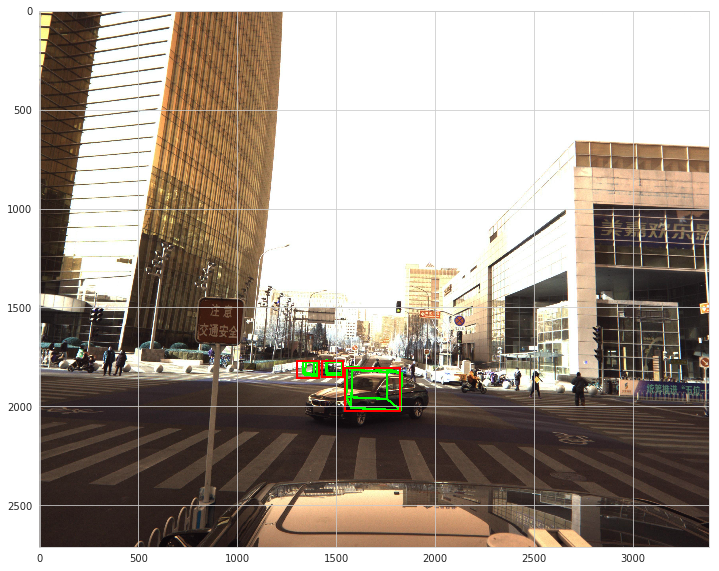

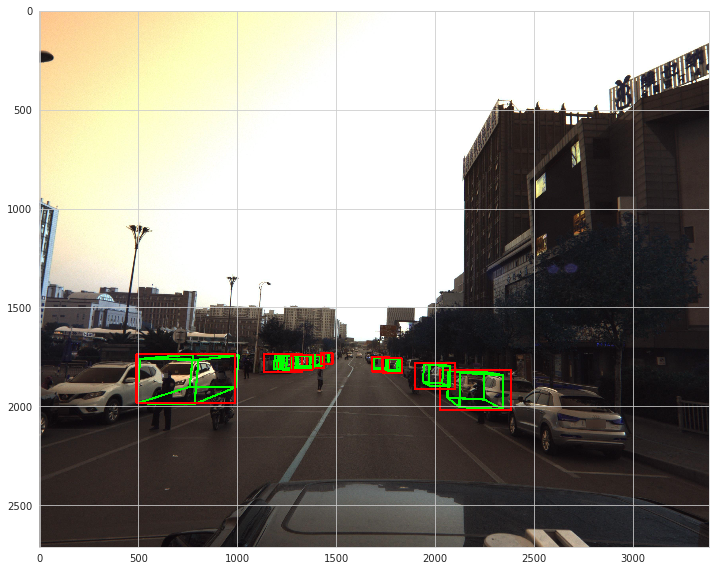

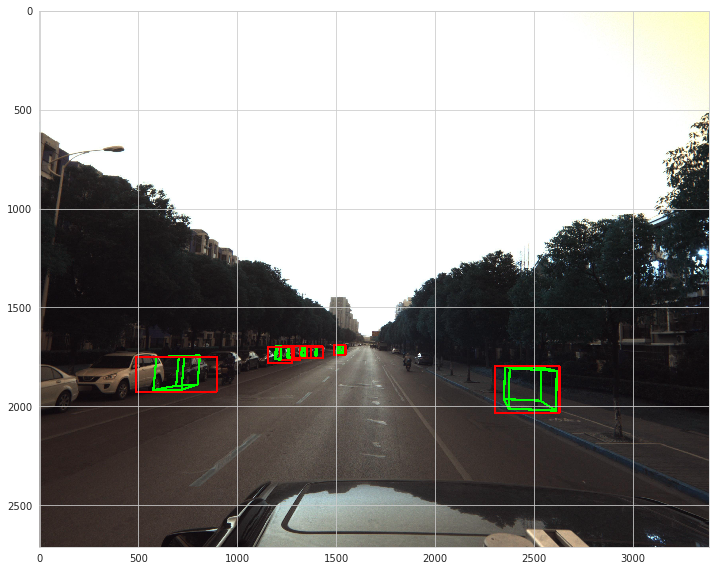

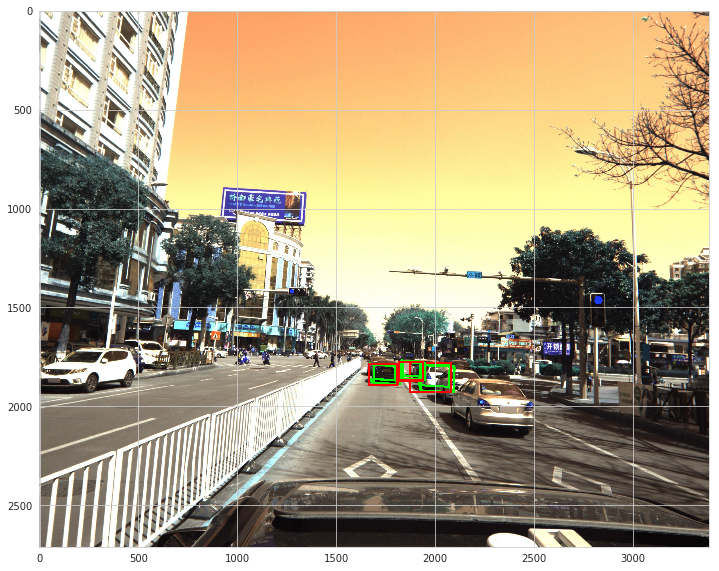

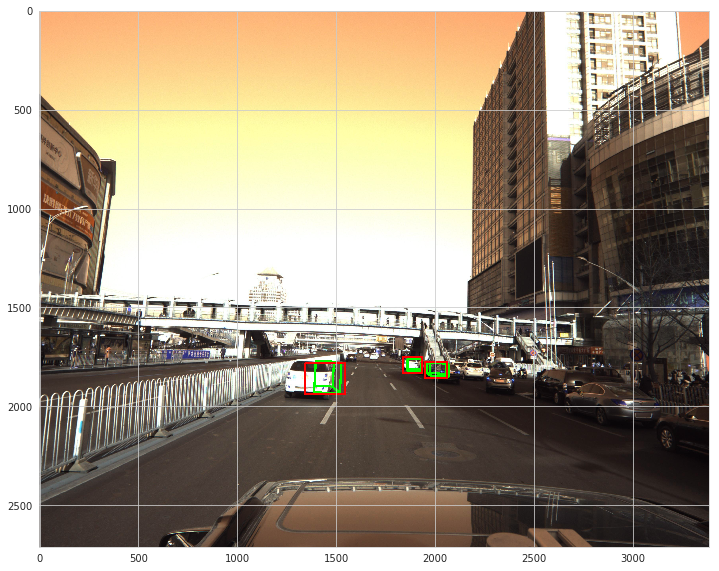

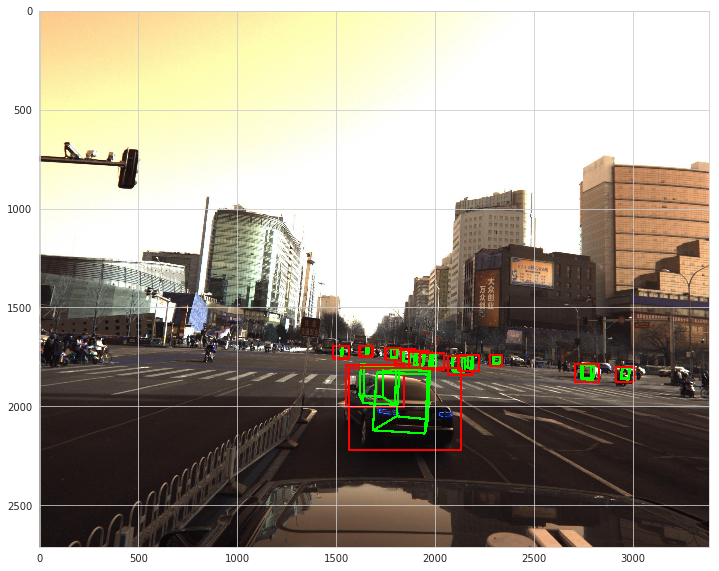

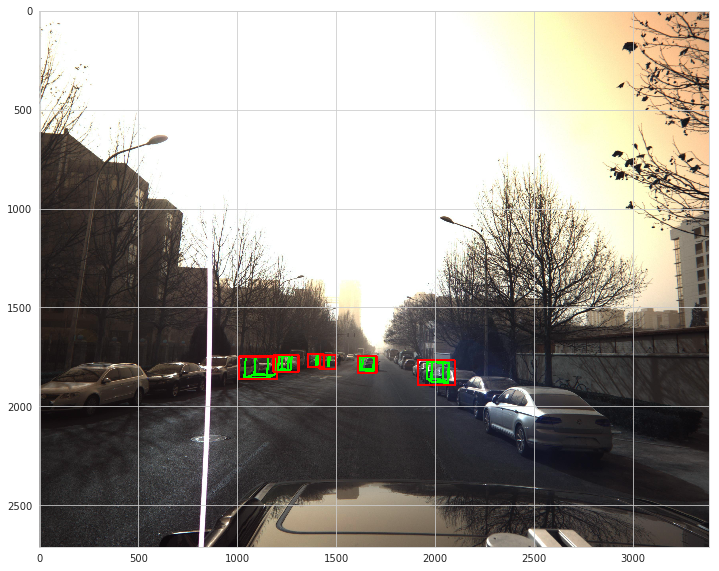

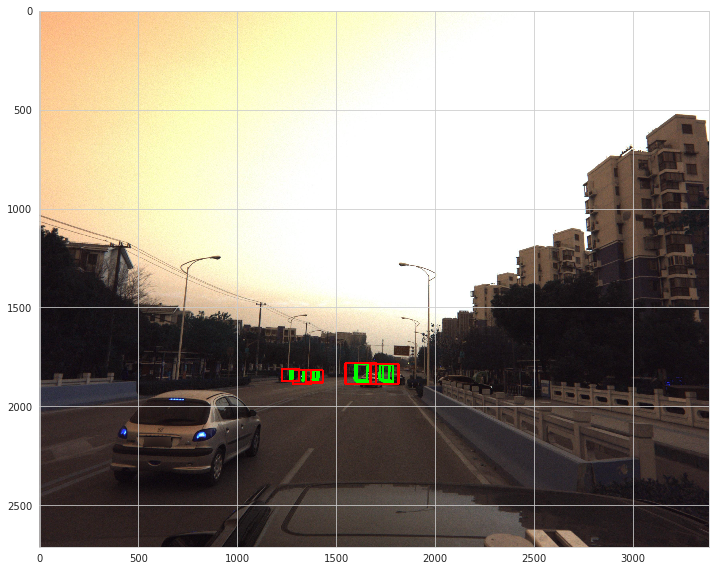

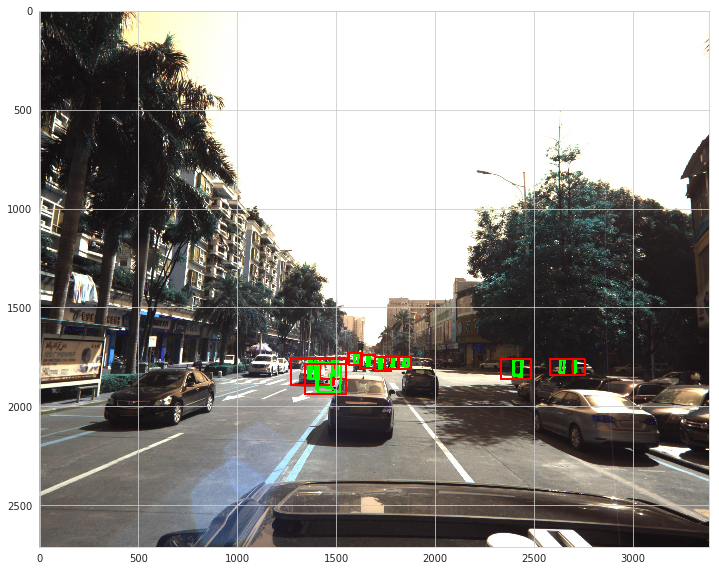

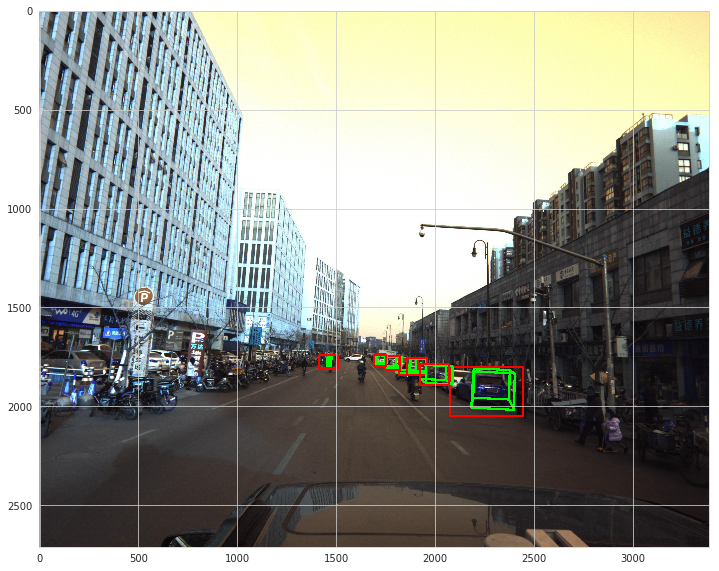

In [31]:
i = 0
# train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=1, shuffle=True)
with torch.no_grad(): 
    for batch in train_loader:
        if i == 10:
            break
            
        orig, img, target = batch
        
        annot = target.numpy()

        img = img.to(DEVICE, dtype=torch.float)
        im = img[0].permute(1, 2, 0).cpu().numpy().copy()
        
        orig = orig[0].cpu().numpy()
        
        detections = model(img)#(img.view(1, *img.shape))
        detections = non_max_suppression(detections, conf_thresh, nms_thesh)
        detections = np.array([detection.cpu().numpy() for detection in detections if detection is not None])
        if len(detections) == 0:
            continue
        for det in detections[0]:
            b = det[:4]
            b = rescale_box(b, IMG_SIZE, orig.shape[:2]).astype('int32')
            v_xy = det[6:22]
            
            x1, y1, x2, y2 = b[:4]

            z = det[22]
            
            v_xs = v_xy[0::2]
            v_ys = v_xy[1::2]
            
            e = np.row_stack([v_xs, v_ys]).T
            e = rescale_volume(e, IMG_SIZE, orig.shape[:2]).astype('int32')
            orig = draw_lines(orig, e.astype('int32'), 10)
            orig = cv2.rectangle(orig, (x1, y1), (x2, y2), (255, 0, 0), 10)
        plt.figure(figsize=(12,19))
        plt.imshow(orig.astype('uint8'))
        plt.show()
        i += 1
        

In [32]:
train_expanded.head()

,ImageId,model_type,yaw,pitch,roll,x,y,z,2d_coords,volume_2d,...,v_y4,v_x5,v_y5,v_x6,v_y6,v_x7,v_y7,v_x8,v_y8,box
0,ID_8a6e65317,16,0.254839,-2.57534,-3.10256,7.96539,3.20066,11.0225,"([-37121, -2045, 3607], [439, 12502, 2034])","[[4046, 1858], [2969, 1869], [4132, 2257], [29...",...,2154,3883,1829,2763,1849,3972,2276,2788,2158,"[2763, 1829, 4132, 2276]"
1,ID_8a6e65317,56,0.181647,-1.46947,-3.12159,9.60332,4.66632,19.3390,"([3049, 7348, 2942], [1806, -7578, 1913])","[[3000, 1816], [2507, 1807], [3015, 2001], [25...",...,1995,3166,1821,2624,1810,3185,2025,2635,2020,"[2507, 1807, 3185, 2025]"
2,ID_8a6e65317,70,0.163072,-1.56865,-3.11754,10.39000,11.22190,59.7825,"([3344, 9172, 2125], [1775, -10413, 1788])","[[2167, 1758], [1992, 1754], [2167, 1819], [19...",...,1815,2184,1759,2003,1754,2184,1822,2003,1818,"[1992, 1754, 2184, 1822]"
3,ID_8a6e65317,70,0.141942,-3.13950,3.11969,-9.59236,5.13662,24.7337,"([-1535, 1828, 755], [1753, 7102, 1840])","[[808, 1763], [956, 1750], [803, 1930], [953, ...",...,1889,600,1767,783,1753,592,1935,778,1892,"[592, 1750, 956, 1935]"
4,ID_8a6e65317,46,0.163068,-2.08578,-3.11754,9.83335,13.26890,72.9323,"([6561, -11908, 2026], [1853, 26914, 1775])","[[2077, 1750], [1942, 1747], [2077, 1802], [19...",...,1797,2054,1750,1916,1746,2055,1803,1916,1798,"[1916, 1746, 2077, 1803]"


In [33]:
for det in detections[0]:
    b = det[:4]
    o_conf = det[5]
    b = rescale_box(b, IMG_SIZE, orig.shape[:2]).astype('int32')
    v_xy = det[6:22]

    x1, y1, x2, y2 = b[:4]

    z = det[22]

    v_xs = v_xy[0::2]
    v_ys = v_xy[1::2]

    e = np.row_stack([v_xs, v_ys]).T
    e = rescale_volume(e, IMG_SIZE, orig.shape[:2]).astype('float32')

    c_x = (x1 + x2) / 2
    c_y = (y1 + y2) / 2

    xyz_im = np.column_stack([c_x, c_y, z])
    xyz = img_cor_2_world_cor(xyz_im)
    x, y, z = xyz
    yaw, pitch, roll = pnp(e)
    print(yaw, pitch, roll, x, y, z)

0.1471143258240876 -0.23994374426878862 -3.0961717648434113 5.784558240229824 5.743505396950008 23.213775634765625
0.14400118027301442 -0.05389565036273612 -3.103385667500896 5.3969575266040835 13.472852317991993 69.57597351074219
0.14731403097950607 -0.11275373415364794 -3.0976275886879305 6.171406846584652 12.280202764185134 63.7022705078125
0.17414661899654713 3.043553013573212 -3.0923535215714026 -7.781156803412749 14.51891422658393 79.61381530761719
0.15007957181101816 -0.02883527748432311 -3.0976116862343286 6.946580991089469 10.761197076154183 51.26696014404297
0.14070061760366717 -0.07549288545587678 -3.101382640737266 3.6212638953563854 15.436875984113087 83.65277099609375
0.1397767233398811 -0.09368078245228666 -3.1002289068356754 1.5468125282213663 17.114335880762276 95.66566467285156


## Make Submission

In [34]:
submission = pd.read_csv('../input/pku-autonomous-driving/sample_submission.csv')
submission.head()

,ImageId,PredictionString
0,ID_18fb86d04,0.5 0.5 0.5 0.0 0.0 0.0 1.0
1,ID_ce06d4dc1,0.5 0.5 0.5 0.0 0.0 0.0 1.0
2,ID_afe07078f,0.5 0.5 0.5 0.0 0.0 0.0 1.0
3,ID_37caf75aa,0.5 0.5 0.5 0.0 0.0 0.0 1.0
4,ID_7655363ca,0.5 0.5 0.5 0.0 0.0 0.0 1.0


  0%|          | 0/2021 [00:00<?, ?it/s]

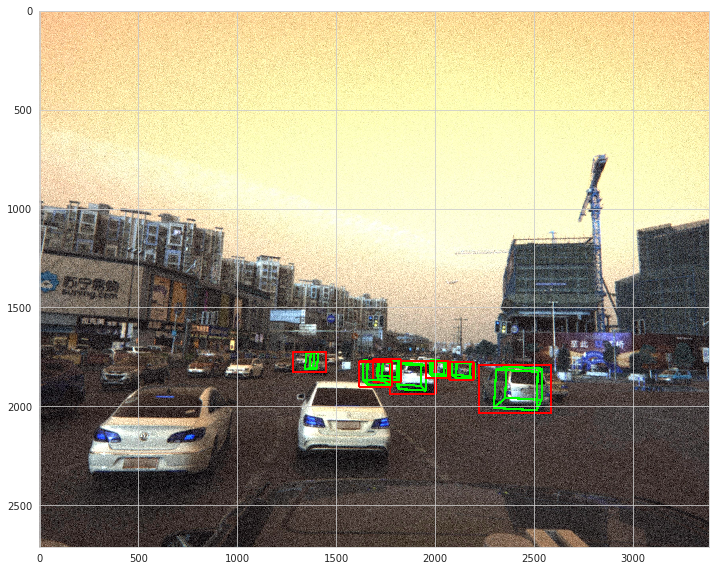

  0%|          | 1/2021 [00:01<40:27,  1.20s/it]

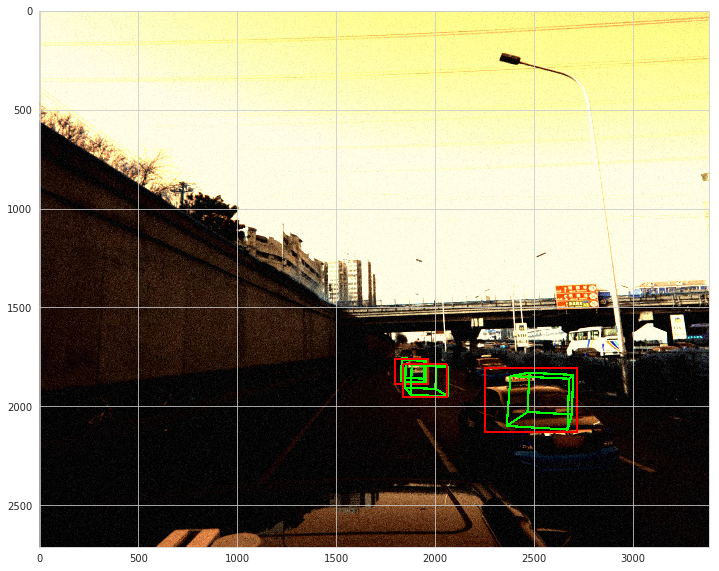

  0%|          | 2/2021 [00:02<40:24,  1.20s/it]

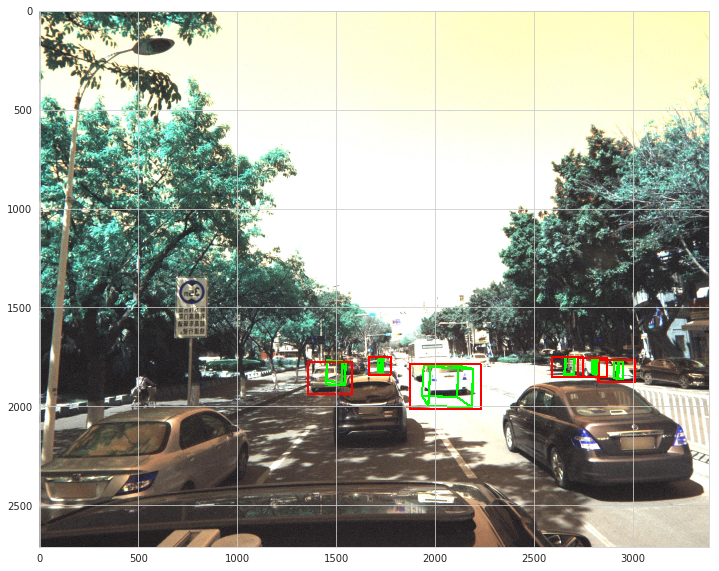

  0%|          | 3/2021 [00:03<39:27,  1.17s/it]

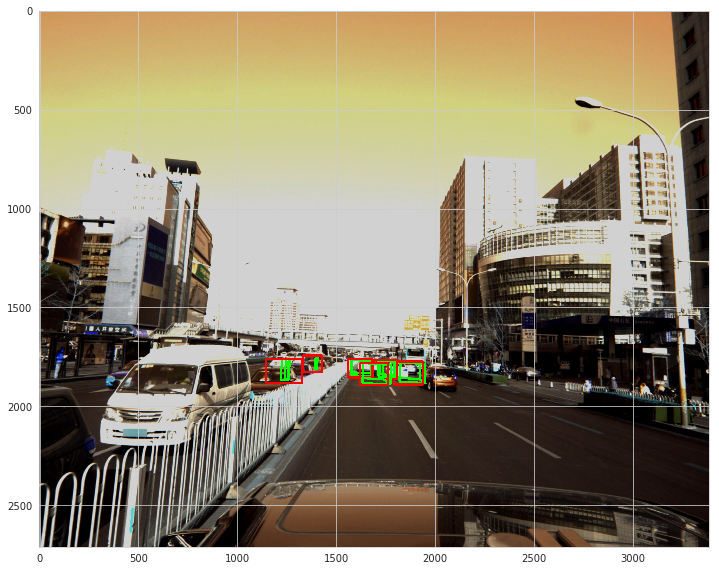

  0%|          | 4/2021 [00:04<38:26,  1.14s/it]

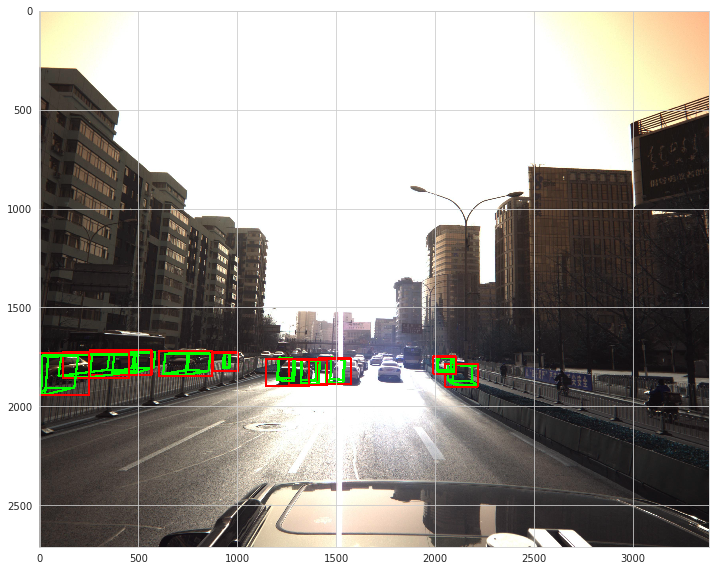

  0%|          | 5/2021 [00:05<37:11,  1.11s/it]

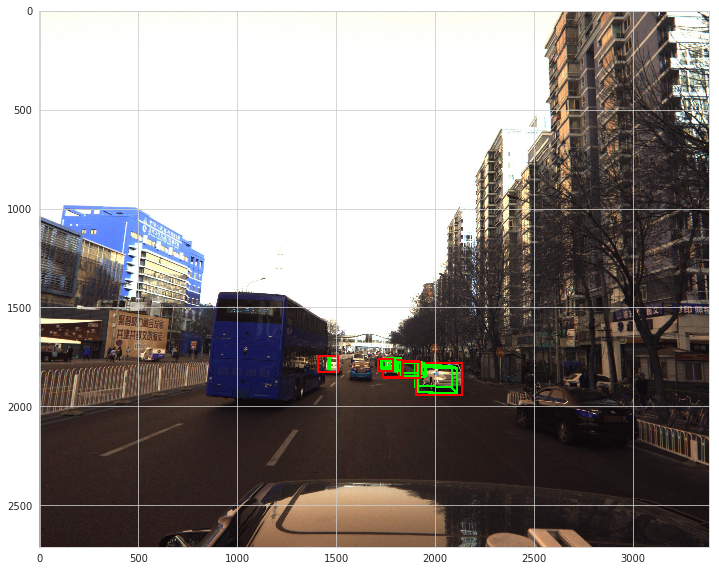

  0%|          | 6/2021 [00:06<36:28,  1.09s/it]

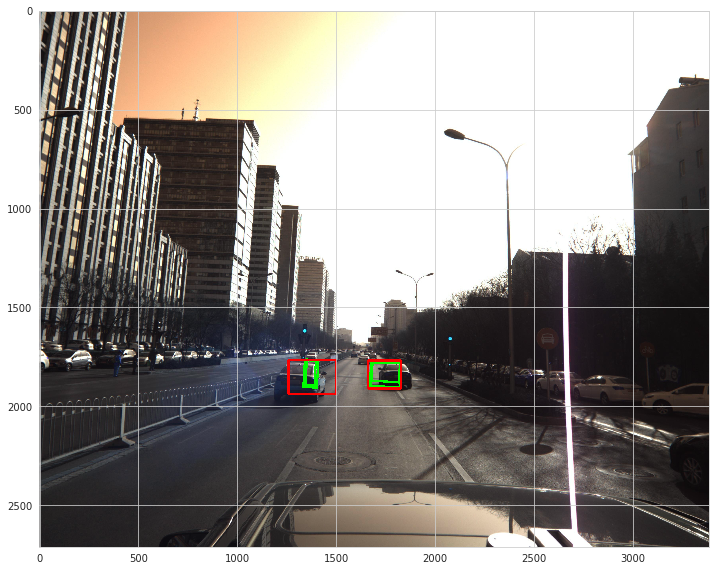

  0%|          | 7/2021 [00:07<35:38,  1.06s/it]

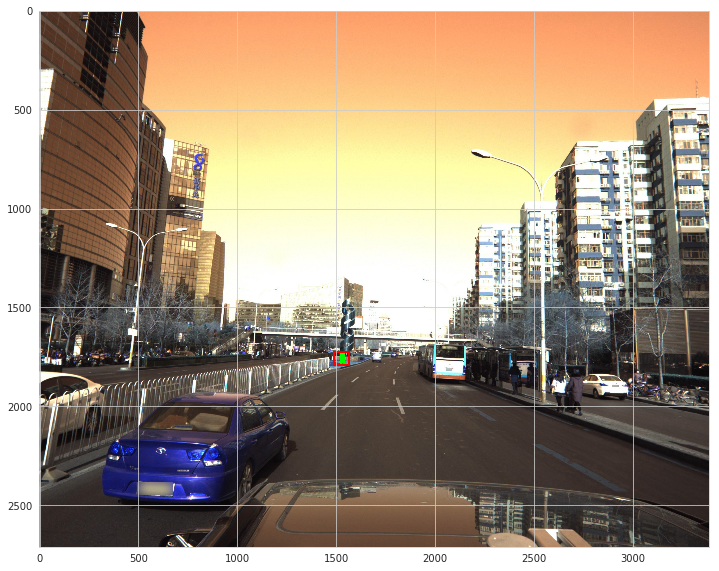

  0%|          | 8/2021 [00:08<36:11,  1.08s/it]

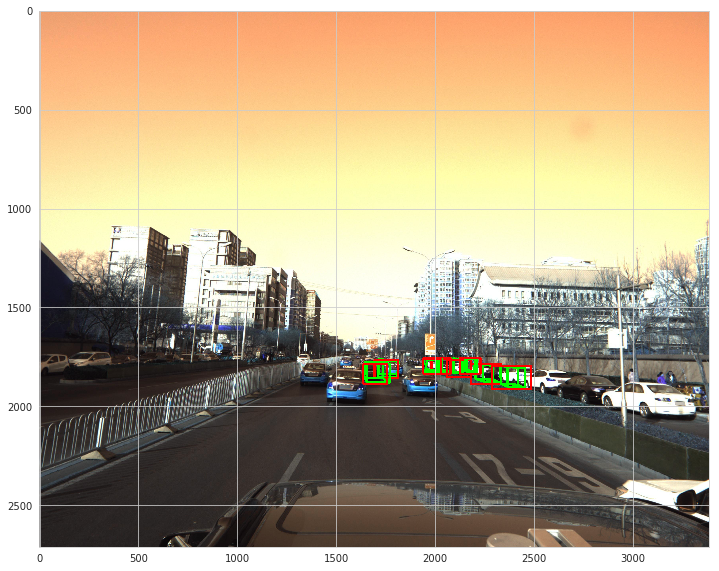

  0%|          | 9/2021 [00:09<36:23,  1.09s/it]

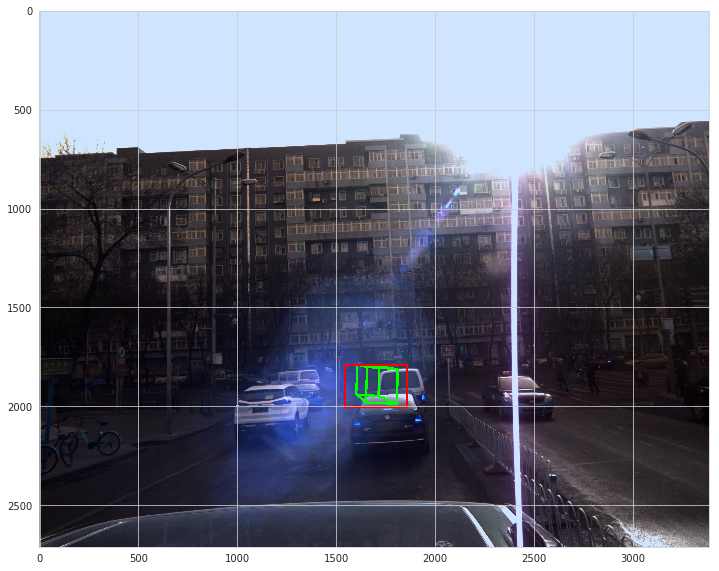

100%|██████████| 2021/2021 [04:56<00:00,  6.81it/s]


In [35]:
i=0
with torch.no_grad():
    for i in tqdm(range(len(test_dataset))):
        orig, img, name = test_dataset[i]
        img = img.to(DEVICE, dtype=torch.float)
        detections = model(img.view(1, *img.shape))
        detections = non_max_suppression(detections, conf_thresh, nms_thesh)
        detections = np.array([detection.cpu().numpy() for detection in detections if detection is not None])
        yprxyzc = []
        
        if len(detections) != 0:

            for det in detections[0]:
                b = det[:4]
                o_conf = det[5]
                b = rescale_box(b, IMG_SIZE, orig.shape[:2]).astype('int32')
                v_xy = det[6:22]

                x1, y1, x2, y2 = b[:4]

                z = det[22]

                v_xs = v_xy[0::2]
                v_ys = v_xy[1::2]

                e = np.row_stack([v_xs, v_ys]).T
                e = rescale_volume(e, IMG_SIZE, orig.shape[:2]).astype('float32')
                                
                c_x = (x1 + x2) / 2
                c_y = (y1 + y2) / 2

                xyz_im = np.column_stack([c_x, c_y, z])
                xyz = img_cor_2_world_cor(xyz_im)
                x, y, z = xyz
                yaw, pitch, roll = pnp(e)
                
                yprxyzc.append((yaw, pitch, roll, x, y, z, o_conf))
                
                if i < 10:
                    orig = draw_lines(orig, e.astype('int32'), 10)
                    orig = cv2.rectangle(orig, (x1, y1), (x2, y2), (255, 0, 0), 10)
            if i < 10:
                plt.figure(figsize=(12,19))
                plt.imshow(orig.astype('uint8'))
                plt.show()
            i += 1
        
        submission.loc[submission['ImageId'] == name.strip(), 'PredictionString'] = " ".join(["{} {} {} {} {} {} {}".format(yaw, pitch, roll, x, y, z, conf) 
                                          for (yaw, pitch, roll, x, y, z, conf) in yprxyzc])
        
submission.to_csv('submission.csv', index=None)
        

# Sample submission

In [36]:
def plot_3d_car(model_json_file):
    with open(f'../input/pku-autonomous-driving/car_models_json/{model_json_file}') as json_file:
        car_model_data = json.load(json_file)

    vertices = np.array(car_model_data['vertices'])
    faces = np.array(car_model_data['faces']) - 1
    car_type = car_model_data['car_type']
    x, y, z = vertices[:,0], vertices[:,2], -vertices[:,1]
    fig = plt.figure(figsize=(30, 10))
    ax = plt.axes(projection='3d')
    ax.plot_trisurf(x, y, faces, z,
                    cmap='viridis', edgecolor='none')
    ax.set_title(car_type)
    ax.view_init(30, 0)
    plt.show()
    fig = plt.figure(figsize=(30, 10))
    ax = plt.axes(projection='3d')
    ax.plot_trisurf(x, y, faces, z,
                    cmap='viridis', edgecolor='none')
    ax.set_title(car_type)
    ax.view_init(60, 0)
    plt.show()
    fig = plt.figure(figsize=(30, 10))
    ax = plt.axes(projection='3d')
    ax.plot_trisurf(x, y, faces, z,
                    cmap='viridis', edgecolor='none')
    ax.set_title(car_type)
    ax.view_init(30, 180)
    plt.show()
    return